In [1]:
import os
import glob
import hashlib
import numpy as np
import tensorflow as tf
import cv2
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2025-05-07 17:08:16.560684: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746637696.819698      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746637696.895666      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Define dataset root path
dataset_path = "/kaggle/input/image-super-resolution/dataset/Raw Data"

# Define low-resolution and high-resolution folder paths
lr_folder = os.path.join(dataset_path, "low_res")
hr_folder = os.path.join(dataset_path, "high_res")


In [3]:
# Function to count images in a folder
def count_images_in_folder(folder_path, image_extensions=['.jpg', '.jpeg', '.png', '.bmp', '.gif']):
    if not os.path.exists(folder_path):
        print(f"Warning: Folder '{folder_path}' not found.")
        return 0
    return sum(len(glob.glob(os.path.join(folder_path, f'*{ext}'))) for ext in image_extensions)

# Count images in each folder
num_lr_images = count_images_in_folder(lr_folder)
num_hr_images = count_images_in_folder(hr_folder)

print(f"Total number of low-resolution images: {num_lr_images}")
print(f"Total number of high-resolution images: {num_hr_images}")

Total number of low-resolution images: 855
Total number of high-resolution images: 855


In [4]:
# Function to remove duplicate images
def get_image_hashes(folder_path):
    image_hashes = {}
    for file in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file)
        if os.path.isfile(file_path):
            with open(file_path, "rb") as f:
                img_hash = hashlib.md5(f.read()).hexdigest()
                if img_hash in image_hashes:
                    os.remove(file_path)  # Remove duplicate
                    print(f"Deleted duplicate: {file_path}")
                else:
                    image_hashes[img_hash] = file_path

# Remove duplicates
get_image_hashes(lr_folder)
get_image_hashes(hr_folder)

print(f"Total number of low-resolution images after removing duplicates: {len(os.listdir(lr_folder))}")
print(f"Total number of high-resolution images after removing duplicates: {len(os.listdir(hr_folder))}")

Total number of low-resolution images after removing duplicates: 855
Total number of high-resolution images after removing duplicates: 855


In [5]:
# Function to load and preprocess images
def load_data(image_path, img_size=(128, 128)):
    images = []
    image_files = sorted(os.listdir(image_path))
    for img_file in image_files:
        img = tf.keras.preprocessing.image.load_img(os.path.join(image_path, img_file), target_size=img_size)
        img = tf.keras.preprocessing.image.img_to_array(img) / 255.0
        images.append(img)
    return np.array(images)

# Load images
IMG_SIZE = (128, 128)
images_lr = load_data(lr_folder, IMG_SIZE)
images_hr = load_data(hr_folder, IMG_SIZE)

print(f"Low-Resolution Images Shape: {images_lr.shape}")
print(f"High-Resolution Images Shape: {images_hr.shape}")

if images_lr.shape[0] != images_hr.shape[0]:
    print(" Warning: LR and HR datasets have different numbers of images!")

Low-Resolution Images Shape: (855, 128, 128, 3)
High-Resolution Images Shape: (855, 128, 128, 3)


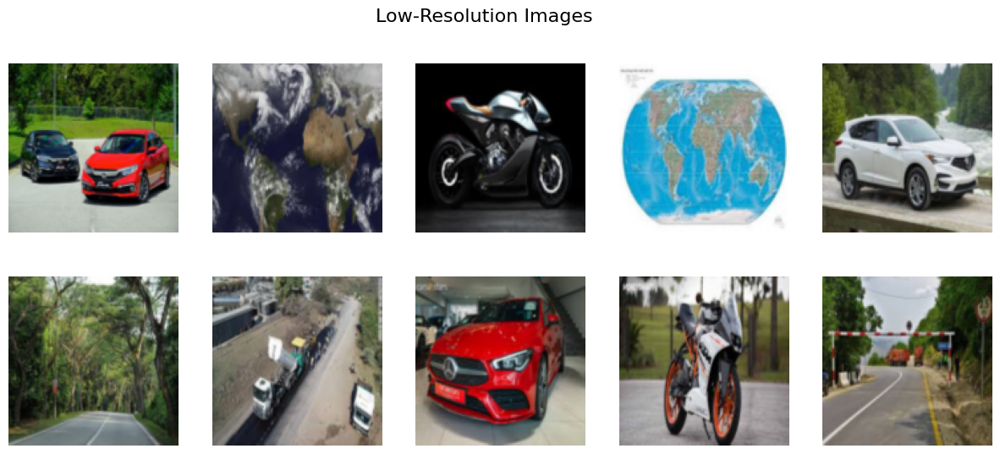

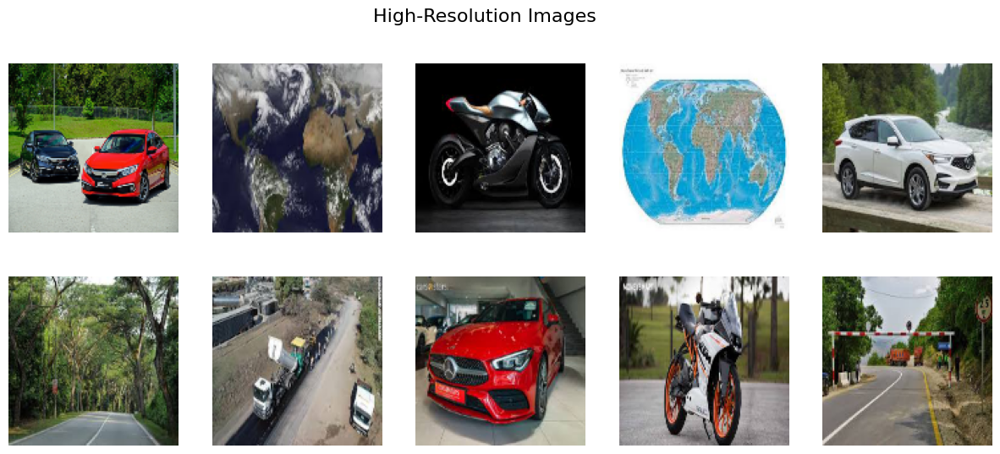

In [6]:
import matplotlib.pyplot as plt
# Display sample images
def display_images(images, title, rows=2, cols=5):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 6))
    fig.suptitle(title, fontsize=16)

    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
            ax.axis("off")
    plt.show()

# Show images
display_images(images_lr, "Low-Resolution Images")
display_images(images_hr, "High-Resolution Images")

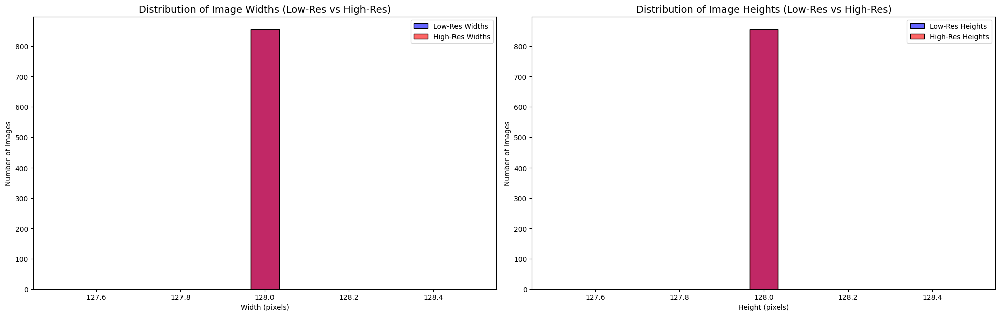

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Extract Widths and Heights
lr_heights = [img.shape[0] for img in images_lr]
lr_widths = [img.shape[1] for img in images_lr]

hr_heights = [img.shape[0] for img in images_hr]
hr_widths = [img.shape[1] for img in images_hr]

# Setup the overall figure
plt.figure(figsize=(20, 12))

# ------------------------
# 1. Overlapped Histogram for Widths
# ------------------------
plt.subplot(2, 2, 1)
sns.histplot(lr_widths, bins=15, color="blue", label="Low-Res Widths", kde=True, alpha=0.6)
sns.histplot(hr_widths, bins=15, color="red", label="High-Res Widths", kde=True, alpha=0.6)
plt.title("Distribution of Image Widths (Low-Res vs High-Res)", fontsize=14)
plt.xlabel("Width (pixels)")
plt.ylabel("Number of Images")
plt.legend()

# ------------------------
# 2. Overlapped Histogram for Heights
# ------------------------
plt.subplot(2, 2, 2)
sns.histplot(lr_heights, bins=15, color="blue", label="Low-Res Heights", kde=True, alpha=0.6)
sns.histplot(hr_heights, bins=15, color="red", label="High-Res Heights", kde=True, alpha=0.6)
plt.title("Distribution of Image Heights (Low-Res vs High-Res)", fontsize=14)
plt.xlabel("Height (pixels)")
plt.ylabel("Number of Images")
plt.legend()

# Adjust layout
plt.tight_layout()
plt.show()
# If images are not distorted — Low-Res and High-Res widths and heights should almost overlap perfectly in histograms and have similar boxplots.

In [8]:
images_hr

array([[[[0.02745098, 0.05490196, 0.03529412],
         [0.01960784, 0.04313726, 0.03137255],
         [0.11372549, 0.25490198, 0.05098039],
         ...,
         [0.3372549 , 0.43529412, 0.45490196],
         [0.43137255, 0.5411765 , 0.5058824 ],
         [0.4627451 , 0.5529412 , 0.6039216 ]],

        [[0.02352941, 0.0627451 , 0.03529412],
         [0.10196079, 0.23137255, 0.05490196],
         [0.2       , 0.35686275, 0.09019608],
         ...,
         [0.2901961 , 0.4       , 0.3882353 ],
         [0.25882354, 0.36862746, 0.24705882],
         [0.4       , 0.5176471 , 0.5529412 ]],

        [[0.00784314, 0.01568628, 0.00784314],
         [0.03137255, 0.05098039, 0.02745098],
         [0.07058824, 0.13725491, 0.04313726],
         ...,
         [0.32941177, 0.43529412, 0.44705883],
         [0.42745098, 0.56078434, 0.627451  ],
         [0.2784314 , 0.4117647 , 0.35686275]],

        ...,

        [[0.6156863 , 0.64705884, 0.6156863 ],
         [0.62352943, 0.6627451 , 0.627451  ]

In [9]:
images_lr

array([[[[0.08235294, 0.15686275, 0.05882353],
         [0.05882353, 0.1254902 , 0.04313726],
         [0.08627451, 0.17254902, 0.05098039],
         ...,
         [0.38431373, 0.4862745 , 0.47843137],
         [0.41568628, 0.52156866, 0.4862745 ],
         [0.43137255, 0.5254902 , 0.53333336]],

        [[0.04313726, 0.10196079, 0.03529412],
         [0.07058824, 0.15686275, 0.04313726],
         [0.11372549, 0.19607843, 0.05882353],
         ...,
         [0.34901962, 0.4627451 , 0.41960785],
         [0.30980393, 0.44313726, 0.3254902 ],
         [0.34117648, 0.45490196, 0.40392157]],

        [[0.01960784, 0.04705882, 0.01960784],
         [0.04705882, 0.09411765, 0.03921569],
         [0.10588235, 0.1882353 , 0.05490196],
         ...,
         [0.35686275, 0.4627451 , 0.4627451 ],
         [0.3019608 , 0.43137255, 0.40784314],
         [0.3019608 , 0.4392157 , 0.39607844]],

        ...,

        [[0.62352943, 0.654902  , 0.62352943],
         [0.6313726 , 0.6666667 , 0.63529414]

In [10]:
from sklearn.model_selection import train_test_split
import numpy as np

# First split into 80% training and 20% testing
x_train_full, x_test, y_train_full, y_test = train_test_split(images_lr, images_hr, test_size=0.2, random_state=42)

# Now split training data further into 85% train and 15% validation
x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size=0.15, random_state=42)

# Check the shapes after splitting
print(f"Training Low-Resolution Shape: {x_train.shape}")
print(f"Validation Low-Resolution Shape: {x_val.shape}")
print(f"Testing Low-Resolution Shape: {x_test.shape}")

print(f"Training High-Resolution Shape: {y_train.shape}")
print(f"Validation High-Resolution Shape: {y_val.shape}")
print(f"Testing High-Resolution Shape: {y_test.shape}")

# Ensure the data format
x_train = x_train.astype('float32')
y_train = y_train.astype('float32')
x_val = x_val.astype('float32')
y_val = y_val.astype('float32')
x_test = x_test.astype('float32')
y_test = y_test.astype('float32')

# Verify the data types after conversion
print(f"x_train dtype: {x_train.dtype}, y_train dtype: {y_train.dtype}")
print(f"x_val dtype: {x_val.dtype}, y_val dtype: {y_val.dtype}")
print(f"x_test dtype: {x_test.dtype}, y_test dtype: {y_test.dtype}")


Training Low-Resolution Shape: (581, 128, 128, 3)
Validation Low-Resolution Shape: (103, 128, 128, 3)
Testing Low-Resolution Shape: (171, 128, 128, 3)
Training High-Resolution Shape: (581, 128, 128, 3)
Validation High-Resolution Shape: (103, 128, 128, 3)
Testing High-Resolution Shape: (171, 128, 128, 3)
x_train dtype: float32, y_train dtype: float32
x_val dtype: float32, y_val dtype: float32
x_test dtype: float32, y_test dtype: float32


**DATA AUGMENTATION**

In [11]:
import numpy as np
import tensorflow as tf
import random

# Random Augmentation Function
def random_augment(lr, hr):
    # Convert to Tensor if not already
    lr = tf.convert_to_tensor(lr, dtype=tf.float32)
    hr = tf.convert_to_tensor(hr, dtype=tf.float32)

    # Random flips and rotations
    if random.random() < 0.5:
        lr = tf.image.flip_left_right(lr)
        hr = tf.image.flip_left_right(hr)
    if random.random() < 0.5:
        lr = tf.image.flip_up_down(lr)
        hr = tf.image.flip_up_down(hr)
    if random.random() < 0.5:
        k = random.choice([1, 2, 3])
        lr = tf.image.rot90(lr, k=k)
        hr = tf.image.rot90(hr, k=k)

    # Set explicit shape
    lr.set_shape((128, 128, 3))
    hr.set_shape((128, 128, 3))

    return lr, hr

# Data Generator
class SuperResolutionDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, lr_images, hr_images, batch_size):
        self.lr_images = lr_images
        self.hr_images = hr_images
        self.batch_size = batch_size
        self.indices = np.arange(len(self.lr_images))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.lr_images) / self.batch_size))

    def __getitem__(self, index):
        # Get batch indices
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]

        lr_batch, hr_batch = [], []

        for idx in batch_indices:
            lr = self.lr_images[idx]
            hr = self.hr_images[idx]
             lr, hr = random_augment(lr, hr)

            lr_batch.append(lr)
            hr_batch.append(hr)

        if len(lr_batch) == 0 or len(hr_batch) == 0:
            print(f"Warning: Empty batch at index {index}, skipping...")
            return self.__getitem__((index + 1) % len(self))

        # Stack arrays
        lr_batch = np.stack(lr_batch, axis=0)
        hr_batch = np.stack(hr_batch, axis=0)

        # 🔥 Print Shapes for Debugging
        #print(f"[Batch {index}] LR Batch Shape: {lr_batch.shape}, HR Batch Shape: {hr_batch.shape}")

        return lr_batch, hr_batch

    def on_epoch_end(self):
        np.random.shuffle(self.indices)

# Initialize correctly
train_generator = SuperResolutionDataGenerator(x_train, y_train, batch_size=16)
#val_generator = SuperResolutionDataGenerator(x_val, y_val, batch_size=16)


In [12]:
print(f"x_train shape: {x_train.shape}, y_train shape: {y_train.shape}")

x_train shape: (581, 128, 128, 3), y_train shape: (581, 128, 128, 3)


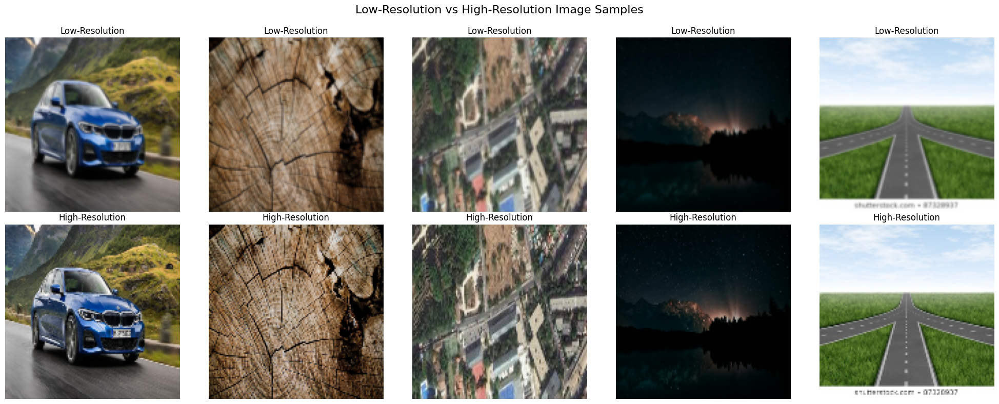

In [11]:
import matplotlib.pyplot as plt

# Function to visualize LR and HR image samples side-by-side
def visualize_data(lr_images, hr_images, n_samples=5):
    plt.figure(figsize=(20, 8))  # Bigger figure for clearer comparison

    for i in range(n_samples):
        # Display Low-Resolution Images
        plt.subplot(2, n_samples, i + 1)
        plt.imshow(lr_images[i])
        plt.title("Low-Resolution", fontsize=12)
        plt.axis('off')

        # Display High-Resolution Images
        plt.subplot(2, n_samples, i + 1 + n_samples)
        plt.imshow(hr_images[i])
        plt.title("High-Resolution", fontsize=12)
        plt.axis('off')

    plt.suptitle('Low-Resolution vs High-Resolution Image Samples', fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)  # Adjust the top spacing for the main title
    plt.show()

# Call the function
visualize_data(x_train, y_train)


# **U-NET ARCHITECTURE**

In [12]:
def unet(input_shape=(128, 128, 3)):
    inputs = layers.Input(input_shape)

    def conv_block(x, filters):
        x = layers.Conv2D(filters, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.1)(x)
        x = layers.Conv2D(filters, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.1)(x)
        return x

    def upsample_block(x, skip, filters):
        x = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(x)
        x = layers.concatenate([x, skip])
        x = conv_block(x, filters)
        return x

    # Encoder
    c1 = conv_block(inputs, 64)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bridge
    c5 = conv_block(p4, 1024)

    # Decoder
    c6 = upsample_block(c5, c4, 512)
    c7 = upsample_block(c6, c3, 256)
    c8 = upsample_block(c7, c2, 128)
    c9 = upsample_block(c8, c1, 64)

    outputs = layers.Conv2D(3, (1, 1), activation='sigmoid')(c9)

    model = models.Model(inputs=[inputs], outputs=[outputs])
    return model

model_unet = unet(input_shape=(128,128,3))

model_unet.summary()

I0000 00:00:1746637802.717228      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746637802.717924      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 128, 128, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 128, 128, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 128, 128, 64)   │         36,928 │ leaky_re_lu[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 128, 128, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 64)     │              0 │ leaky_re_lu_1[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 64, 64, 128)    │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 64, 64, 128)    │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 128)    │        147,584 │ leaky_re_lu_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 64, 64, 128)    │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_3 (LeakyReLU) │ (None, 64, 64, 128)    │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 32, 32, 128)    │              0 │ leaky_re_lu_3[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 31,055,427 (118.47 MB)

 Trainable params: 31,043,651 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [13]:
# CUSTOM METRICS
# PSNR metric
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

# SSIM metric
def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

# Custom Combined Loss (MSE + SSIM Loss)
def combined_loss(y_true, y_pred):
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
    return 0.8 * mse + 0.2 * ssim_loss

# Compile the U-Net model
model_unet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=combined_loss,  # MSE loss because you are doing image super-resolution
    metrics=[psnr, ssim]  # Track PSNR and SSIM during training
)

from tensorflow.keras.callbacks import LambdaCallback
# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1),
    ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min', verbose=1)
]


In [14]:
# Training
history = model_unet.fit(
    x_train, y_train,
    validation_data=(x_val,y_val),
    epochs=200,
    callbacks=callbacks
)

Epoch 1/200


I0000 00:00:1746637837.776267      99 service.cc:148] XLA service 0x794f98013d70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746637837.777226      99 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746637837.777246      99 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
W0000 00:00:1746637838.897894      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1746637838.898899      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1746637838.899679      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1746637838.900273      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
W0000 00:00:1746637838.900439      99 assert_op.cc:38] Ignoring Assert operator PSNR/Asse

18/19 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step - loss: 0.7665 - psnr: 11.8035 - ssim: 0.2011

W0000 00:00:1746637893.069927      98 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1746637893.070213      98 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1746637893.070643      98 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1746637893.070873      98 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
W0000 00:00:1746637893.070905      98 assert_op.cc:38] Ignoring Assert operator PSNR/Assert/Assert
W0000 00:00:1746637893.070922      98 assert_op.cc:38] Ignoring Assert operator PSNR/Assert_1/Assert
W0000 00:00:1746637893.070942      98 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1746637893.070967      98 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1746637893.071343      98 assert_op.cc:38] Ignoring Assert operator SSIM/Asser

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.7625 - psnr: 11.9410 - ssim: 0.2105   
Epoch 1: val_loss improved from inf to 0.70294, saving model to best_model.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 108s 2s/step - loss: 0.7589 - psnr: 12.0647 - ssim: 0.2190 - val_loss: 0.7029 - val_psnr: 11.1107 - val_ssim: 0.2881 - learning_rate: 1.0000e-04
Epoch 2/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step - loss: 0.5486 - psnr: 18.6852 - ssim: 0.6972
Epoch 2: val_loss improved from 0.70294 to 0.62893, saving model to best_model.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 533ms/step - loss: 0.5475 - psnr: 18.7240 - ssim: 0.6987 - val_loss: 0.6289 - val_psnr: 11.3290 - val_ssim: 0.3091 - learning_rate: 1.0000e-04
Epoch 3/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - loss: 0.4595 - psnr: 21.3751 - ssim: 0.7869
Epoch 3: val_loss improved from 0.62893 to 0.56342, saving model to best_model.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 539ms/step - loss: 0.4588 - psnr: 21.3787 - ssim: 0.7873 - val_loss: 0.5634 - val_psnr:

In [17]:
# Try to fetch 1 batch manually
#x_batch, y_batch = train_generator[0]
#print(f"Input batch shape: {x_batch.shape}, Target batch shape: {y_batch.shape}")

# Also print model input expectation
#print(f"Model input shape: {model_unet.input_shape}, Model output shape: {model_unet.output_shape}")

Input batch shape: (16, 128, 128, 3), Target batch shape: (16, 128, 128, 3)
Model input shape: (None, 128, 128, 3), Model output shape: (None, 128, 128, 3)


In [15]:
# Evaluate the model
test_loss, test_psnr, test_ssim = model_unet.evaluate(x_test, y_test, verbose=1)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test PSNR: {test_psnr:.4f}")
print(f"Test SSIM: {test_ssim:.4f}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - loss: 0.0326 - psnr: 30.5577 - ssim: 0.9405 
Test Loss: 0.0326
Test PSNR: 30.5627
Test SSIM: 0.9403


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 529ms/step


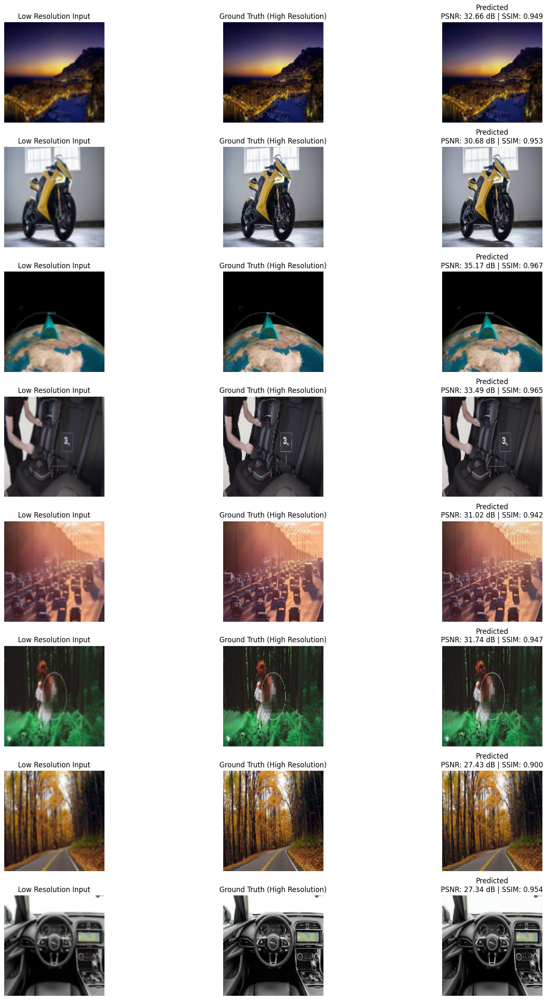

In [16]:
# ADVANCED VISUALISATION with PSNR and SSIM
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# PSNR Calculation
def calculate_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0).numpy()

# SSIM Calculation
def calculate_ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0).numpy()

# Advanced Visualization
def advanced_visualize_results(low_res, high_res, predicted, num_samples=8):
    plt.figure(figsize=(18, num_samples * 3))

    for i in range(num_samples):
        # Low Resolution Input
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(low_res[i])
        plt.title("Low Resolution Input")
        plt.axis('off')

        # High Resolution Ground Truth
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(high_res[i])
        plt.title("Ground Truth (High Resolution)")
        plt.axis('off')

        # Predicted Super-Resolution + Metrics
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(predicted[i])

        # Calculate PSNR and SSIM for this sample
        psnr_score = calculate_psnr(high_res[i], predicted[i])
        ssim_score = calculate_ssim(high_res[i], predicted[i])

        plt.title(f"Predicted\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# -------------------------------------------------

# Predict and visualize
predicted_images = model_unet.predict(x_test, verbose=1)

# Clip predictions to [0, 1]
predicted_images = np.clip(predicted_images, 0., 1.)

# Call the advanced visualization
advanced_visualize_results(x_test, y_test, predicted_images, num_samples=8)


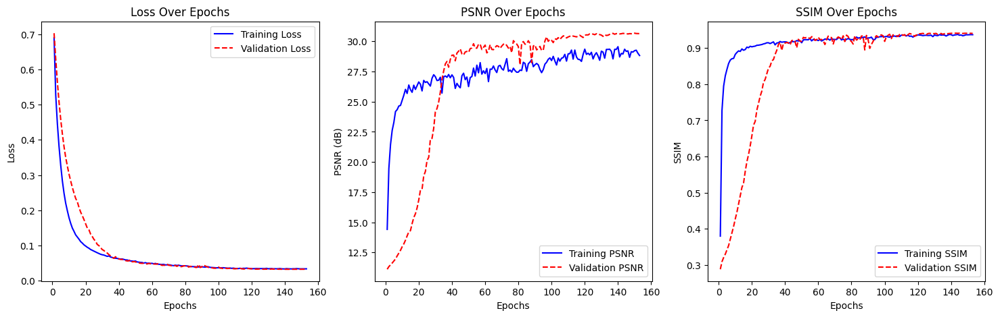

In [17]:
import matplotlib.pyplot as plt

# Assuming you extracted these from history.history
epochs = range(1, len(history.history['loss']) + 1)

plt.figure(figsize=(18,5))

# Loss
plt.subplot(1,3,1)
plt.plot(epochs, history.history['loss'], 'b-', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'r--', label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# PSNR
plt.subplot(1,3,2)
plt.plot(epochs, history.history['psnr'], 'b-', label='Training PSNR')
plt.plot(epochs, history.history['val_psnr'], 'r--', label='Validation PSNR')
plt.title('PSNR Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.legend()

# SSIM
plt.subplot(1,3,3)
plt.plot(epochs, history.history['ssim'], 'b-', label='Training SSIM')
plt.plot(epochs, history.history['val_ssim'], 'r--', label='Validation SSIM')
plt.title('SSIM Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()

plt.show()

In [22]:
# Save Final Model
model_unet.save('unet_model.keras')

In [23]:
#Load it later:
from tensorflow.keras.models import load_model

# Load model
model_1 = load_model('unet_model.keras', compile=False)

# **VGG16 + UNET**

In [12]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

In [13]:
# VGG16 + U-Net Architecture
def vgg16_unet(input_shape=(128,128,3)):
    inputs = layers.Input(shape=input_shape)

    # Load VGG16 with pretrained weights
    vgg = VGG16(weights='imagenet', include_top=False, input_tensor=inputs)

    # Encoder: Get intermediate feature maps
    c1 = vgg.get_layer('block1_conv2').output
    p1 = vgg.get_layer('block1_pool').output

    c2 = vgg.get_layer('block2_conv2').output
    p2 = vgg.get_layer('block2_pool').output

    c3 = vgg.get_layer('block3_conv3').output
    p3 = vgg.get_layer('block3_pool').output

    c4 = vgg.get_layer('block4_conv3').output
    p4 = vgg.get_layer('block4_pool').output

    # Bridge
    c5 = vgg.get_layer('block5_conv3').output

    # Decoder
    u6 = layers.Conv2DTranspose(512, (2,2), strides=(2,2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3,3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3,3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2,2), strides=(2,2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3,3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3,3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2,2), strides=(2,2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3,3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3,3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(c9)

    outputs = layers.Conv2D(3, (1,1), activation='sigmoid')(c9)

    model = models.Model(inputs=[inputs], outputs=[outputs])

    # Freeze VGG16 Encoder layers initially
    #for layer in vgg.layers:
     #   layer.trainable = False

    return model

model_vgg16_unet = vgg16_unet(input_shape=(128,128,3))

model_vgg16_unet.summary()

I0000 00:00:1745988508.488089      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745988508.488775      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 128, 128, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 128, 128, 64)   │         36,928 │ block1_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_pool               │ (None, 64, 64, 64)     │              0 │ block1_conv2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv1 (Conv2D)     │ (None, 64, 64, 128)    │         73,856 │ block1_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv2 (Conv2D)     │ (None, 64, 64, 128)    │        147,584 │ block2_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 32, 32, 128)    │              0 │ block2_conv2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv1 (Conv2D)     │ (None, 32, 32, 256)    │        295,168 │ block2_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv2 (Conv2D)     │ (None, 32, 32, 256)    │        590,080 │ block3_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv3 (Conv2D)     │ (None, 32, 32, 256)    │        590,080 │ block3_conv2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_pool               │ (None, 16, 16, 256)    │              0 │ block3_conv3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv1 (Conv2D)     │ (None, 16, 16, 512)    │      1,180,160 │ block3_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv2 (Conv2D)     │ (None, 16, 16, 512)    │      2,359,808 │ block4_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv3 (Conv2D)     │ (None, 16, 16, 512)    │      2,359,808 │ block4_conv2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_pool               │ (None, 8, 8, 512)      │              0 │ block4_conv3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block5_conv1 (Conv2D)     │ (None, 8, 8, 512)      │      2,359,808 │ block4_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block5_conv2 (Conv2D)     │ (None, 8, 8, 512)      │      2,359,808 │ block5_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block5_conv3 (Conv2D)

 Total params: 25,854,787 (98.63 MB)

 Trainable params: 25,854,787 (98.63 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
# Custom Metrics
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

# Custom Combined Loss (MSE + SSIM Loss)
def combined_loss(y_true, y_pred):
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
    return 0.8 * mse + 0.2 * ssim_loss

# Compile the model
model_vgg16_unet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=combined_loss,
    metrics=[psnr, ssim]
)

In [15]:
# 6. Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, verbose=1),
    ModelCheckpoint('best_model_vgg16_unet.keras', save_best_only=True, monitor='val_loss', mode='min', verbose=1)
]

In [16]:
# Training
history = model_vgg16_unet.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=200,
    batch_size=16,
    callbacks=callbacks
)

Epoch 1/200


I0000 00:00:1745988538.558101      97 service.cc:148] XLA service 0x7fe8bc002610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745988538.558828      97 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1745988538.558851      97 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
W0000 00:00:1745988539.160807      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1745988539.161834      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1745988539.162726      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1745988539.163422      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
W0000 00:00:1745988539.163521      97 assert_op.cc:38] Ignoring Assert operator PSNR/Asse

36/37 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.1997 - psnr: 12.3492 - ssim: 0.3290

W0000 00:00:1745988572.877460      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1745988572.877686      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1745988572.878074      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1745988572.878288      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
W0000 00:00:1745988572.878322      99 assert_op.cc:38] Ignoring Assert operator PSNR/Assert/Assert
W0000 00:00:1745988572.878338      99 assert_op.cc:38] Ignoring Assert operator PSNR/Assert_1/Assert
W0000 00:00:1745988572.878358      99 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1745988572.878386      99 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1745988572.878695      99 assert_op.cc:38] Ignoring Assert operator SSIM/Asser

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 664ms/step - loss: 0.1978 - psnr: 12.4321 - ssim: 0.3343
Epoch 1: val_loss improved from inf to 0.05612, saving model to best_model_vgg16_unet.keras
37/37 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - loss: 0.1960 - psnr: 12.5106 - ssim: 0.3394 - val_loss: 0.0561 - val_psnr: 20.8255 - val_ssim: 0.7551 - learning_rate: 1.0000e-04
Epoch 2/200
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0486 - psnr: 21.0728 - ssim: 0.7915
Epoch 2: val_loss improved from 0.05612 to 0.03998, saving model to best_model_vgg16_unet.keras
37/37 ━━━━━━━━━━━━━━━━━━━━ 11s 305ms/step - loss: 0.0485 - psnr: 21.0896 - ssim: 0.7919 - val_loss: 0.0400 - val_psnr: 22.7462 - val_ssim: 0.8229 - learning_rate: 1.0000e-04
Epoch 3/200
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - loss: 0.0370 - psnr: 22.8384 - ssim: 0.8383
Epoch 3: val_loss improved from 0.03998 to 0.03403, saving model to best_model_vgg16_unet.keras
37/37 ━━━━━━━━━━━━━━━━━━━━ 11s 310ms/step - loss: 0.0369 - psnr: 22.8481 - ssim: 0.838

In [17]:
# Evaluate Final Model
test_loss, test_psnr, test_ssim = model_vgg16_unet.evaluate(x_test, y_test)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test PSNR: {test_psnr:.4f}")
print(f"Test SSIM: {test_ssim:.4f}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - loss: 0.0148 - psnr: 29.9768 - ssim: 0.9310 
Test Loss: 0.0148
Test PSNR: 29.9937
Test SSIM: 0.9311


In [18]:
# Fine-tune Later: Unfreeze Last Two Blocks and Retrain
for layer in model_vgg16_unet.layers:
    if 'block5' in layer.name or 'block4' in layer.name:
        layer.trainable = True

model_vgg16_unet.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss=combined_loss,
    metrics=[psnr, ssim]
)

In [19]:
# Fine-tune Training
history_finetune = model_vgg16_unet.fit(
    x_train, y_train,
    validation_data=(x_test, y_test),
    epochs=100,
    batch_size=16,
    callbacks=callbacks
)

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - loss: 0.0147 - psnr: 29.8636 - ssim: 0.9320
Epoch 1: val_loss did not improve from 0.01431
37/37 ━━━━━━━━━━━━━━━━━━━━ 31s 463ms/step - loss: 0.0147 - psnr: 29.8624 - ssim: 0.9320 - val_loss: 0.0148 - val_psnr: 29.9792 - val_ssim: 0.9311 - learning_rate: 1.0000e-05
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - loss: 0.0144 - psnr: 29.8255 - ssim: 0.9332
Epoch 2: val_loss did not improve from 0.01431
37/37 ━━━━━━━━━━━━━━━━━━━━ 11s 309ms/step - loss: 0.0144 - psnr: 29.8270 - ssim: 0.9332 - val_loss: 0.0148 - val_psnr: 30.0014 - val_ssim: 0.9312 - learning_rate: 1.0000e-05
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - loss: 0.0149 - psnr: 29.7797 - ssim: 0.9307
Epoch 3: val_loss did not improve from 0.01431
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 318ms/step - loss: 0.0149 - psnr: 29.7828 - ssim: 0.9308 - val_loss: 0.0147 - val_psnr: 29.9972 - val_ssim: 0.9313 - learning_rate: 1.0000e-05
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0

In [20]:
# Evaluate Final Model
test_loss, test_psnr, test_ssim = model_vgg16_unet.evaluate(x_test, y_test)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test PSNR: {test_psnr:.4f}")
print(f"Test SSIM: {test_ssim:.4f}")

# Save Final Model
model_vgg16_unet.save('vgg16_unet_model.keras')

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0148 - psnr: 29.9595 - ssim: 0.9310
Test Loss: 0.0148
Test PSNR: 29.9792
Test SSIM: 0.9311


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 318ms/step


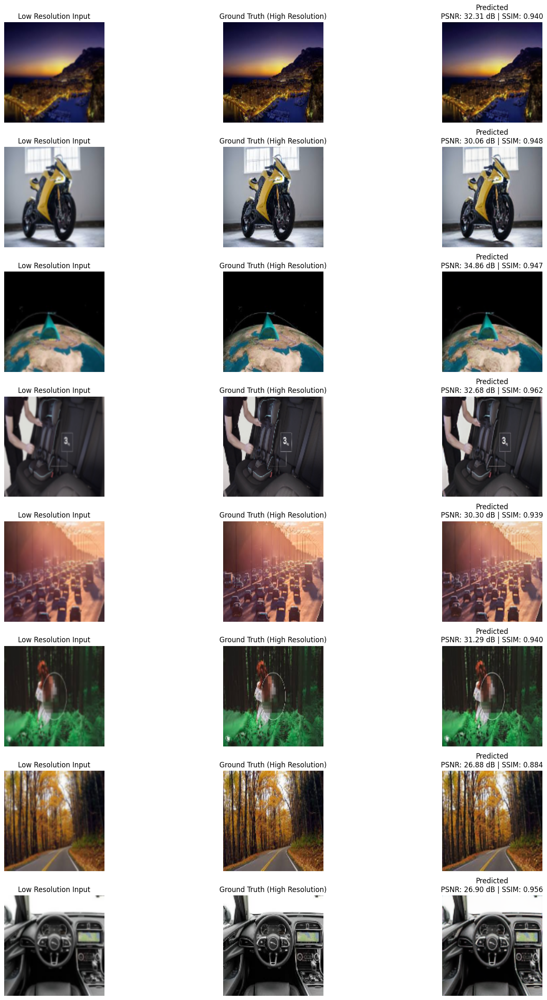

In [21]:
# ADVANCED VISUALISATION with PSNR and SSIM
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# PSNR Calculation
def calculate_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0).numpy()

# SSIM Calculation
def calculate_ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0).numpy()

# Advanced Visualization
def advanced_visualize_results(low_res, high_res, predicted, num_samples=8):
    plt.figure(figsize=(18, num_samples * 3))

    for i in range(num_samples):
        # Low Resolution Input
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(low_res[i])
        plt.title("Low Resolution Input")
        plt.axis('off')

        # High Resolution Ground Truth
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(high_res[i])
        plt.title("Ground Truth (High Resolution)")
        plt.axis('off')

        # Predicted Super-Resolution + Metrics
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(predicted[i])

        # Calculate PSNR and SSIM for this sample
        psnr_score = calculate_psnr(high_res[i], predicted[i])
        ssim_score = calculate_ssim(high_res[i], predicted[i])

        plt.title(f"Predicted\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# -------------------------------------------------

# Predict and visualize
predicted_images = model_vgg16_unet.predict(x_test, verbose=1)

# Clip predictions to [0, 1]
predicted_images = np.clip(predicted_images, 0., 1.)

# Call the advanced visualization
advanced_visualize_results(x_test, y_test, predicted_images, num_samples=8)


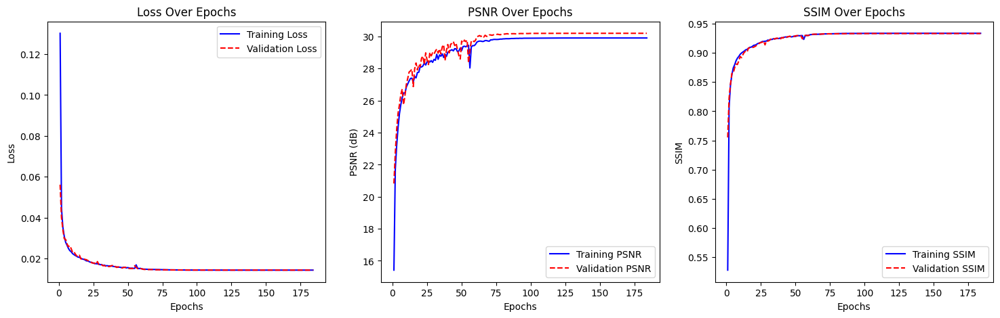

In [22]:
import matplotlib.pyplot as plt

# Assuming you extracted these from history.history
epochs = range(1, len(history.history['loss']) + 1)

plt.figure(figsize=(18,5))

# Loss
plt.subplot(1,3,1)
plt.plot(epochs, history.history['loss'], 'b-', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'r--', label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# PSNR
plt.subplot(1,3,2)
plt.plot(epochs, history.history['psnr'], 'b-', label='Training PSNR')
plt.plot(epochs, history.history['val_psnr'], 'r--', label='Validation PSNR')
plt.title('PSNR Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.legend()

# SSIM
plt.subplot(1,3,3)
plt.plot(epochs, history.history['ssim'], 'b-', label='Training SSIM')
plt.plot(epochs, history.history['val_ssim'], 'r--', label='Validation SSIM')
plt.title('SSIM Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()

plt.show()

In [24]:
# Download it
#from google.colab import files
#files.download('vgg16_unet_model.keras')

In [ ]:
#Load it later:
from tensorflow.keras.models import load_model

# Load model
model_2 = load_model('best_model_vgg16_unet.keras', compile=False)

# **RESNET + UNET**

In [13]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

def resnet50_unet(input_shape=(128,128,3)):
    inputs = layers.Input(shape=input_shape)

    # Load ResNet50
    resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=inputs)

    # Encoder
    c1 = resnet.get_layer('conv1_relu').output          # 64 filters
    p1 = resnet.get_layer('pool1_pool').output

    c2 = resnet.get_layer('conv2_block3_out').output     # 256 filters
    c3 = resnet.get_layer('conv3_block4_out').output     # 512 filters
    c4 = resnet.get_layer('conv4_block6_out').output     # 1024 filters
    c5 = resnet.get_layer('conv5_block3_out').output     # 2048 filters

    # Decoder
    u6 = layers.Conv2DTranspose(1024, (2,2), strides=(2,2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(1024, (3,3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(1024, (3,3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(512, (2,2), strides=(2,2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(512, (3,3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(512, (3,3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(256, (2,2), strides=(2,2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(256, (3,3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(256, (3,3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(c9)

    # Extra upsampling to match 128x128
    u10 = layers.Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c9)
    c10 = layers.Conv2D(32, (3,3), activation='relu', padding='same')(u10)
    c10 = layers.Conv2D(32, (3,3), activation='relu', padding='same')(c10)

    outputs = layers.Conv2D(3, (1,1), activation='sigmoid')(c10)

    model = models.Model(inputs=[inputs], outputs=[outputs])

    return model

# Build Model
model_resnet50_unet = resnet50_unet(input_shape=(128,128,3))

# Summary
model_resnet50_unet.summary()

I0000 00:00:1745995561.553666      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745995561.554361      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 134, 134, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 64, 64, 64)     │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 64, 64, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 64, 64, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 66, 66, 64)     │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 32, 32, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 32, 32, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 32, 32, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 32, 32, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 32, 32, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 32, 32, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 32, 32, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 32, 32, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 32, 32, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 71,965,187 (274.53 MB)

 Trainable params: 71,912,067 (274.32 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [14]:
# Custom Metrics
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

# Custom Combined Loss (MSE + SSIM Loss)
def combined_loss(y_true, y_pred):
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
    return 0.8 * mse + 0.2 * ssim_loss

# Compile the model
model_resnet50_unet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=combined_loss,
    metrics=[psnr, ssim]
)

In [15]:
# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, verbose=1),
    ModelCheckpoint('best_model_resnet50_unet.keras', save_best_only=True, monitor='val_loss', mode='min', verbose=1)
]

In [16]:
# Training
history = model_resnet50_unet.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=200,
    batch_size=16,
    callbacks=callbacks
)

Epoch 1/200


I0000 00:00:1745995645.114463      99 service.cc:148] XLA service 0x7edfec001450 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745995645.115296      99 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1745995645.115317      99 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
W0000 00:00:1745995648.091938      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1745995648.093013      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1745995648.093988      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1745995648.094630      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
W0000 00:00:1745995648.094799      99 assert_op.cc:38] Ignoring Assert operator PSNR/Asse

36/37 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.2258 - psnr: 10.8513 - ssim: 0.2342

W0000 00:00:1745995699.292336      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1745995699.292543      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1745995699.292980      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1745995699.293220      99 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
W0000 00:00:1745995699.293252      99 assert_op.cc:38] Ignoring Assert operator PSNR/Assert/Assert
W0000 00:00:1745995699.293272      99 assert_op.cc:38] Ignoring Assert operator PSNR/Assert_1/Assert
W0000 00:00:1745995699.293303      99 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1745995699.293323      99 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1745995699.293625      99 assert_op.cc:38] Ignoring Assert operator SSIM/Asser

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.2253 - psnr: 10.8618 - ssim: 0.2357   
Epoch 1: val_loss improved from inf to 0.23397, saving model to best_model_resnet50_unet.keras
37/37 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - loss: 0.2249 - psnr: 10.8717 - ssim: 0.2372 - val_loss: 0.2340 - val_psnr: 10.3180 - val_ssim: 0.2452 - learning_rate: 1.0000e-04
Epoch 2/200
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.1407 - psnr: 13.7237 - ssim: 0.4978
Epoch 2: val_loss improved from 0.23397 to 0.21875, saving model to best_model_resnet50_unet.keras
37/37 ━━━━━━━━━━━━━━━━━━━━ 14s 393ms/step - loss: 0.1402 - psnr: 13.7566 - ssim: 0.4992 - val_loss: 0.2187 - val_psnr: 11.1898 - val_ssim: 0.2387 - learning_rate: 1.0000e-04
Epoch 3/200
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - loss: 0.0791 - psnr: 18.2698 - ssim: 0.6732
Epoch 3: val_loss improved from 0.21875 to 0.21611, saving model to best_model_resnet50_unet.keras
37/37 ━━━━━━━━━━━━━━━━━━━━ 15s 408ms/step - loss: 0.0790 - psnr: 18.2722 - s

In [17]:
# Evaluate Final Model
test_loss, test_psnr, test_ssim = model_resnet50_unet.evaluate(x_test, y_test)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test PSNR: {test_psnr:.4f}")
print(f"Test SSIM: {test_ssim:.4f}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - loss: 0.0202 - psnr: 28.2757 - ssim: 0.9061 
Test Loss: 0.0201
Test PSNR: 28.2451
Test SSIM: 0.9066


In [18]:
# Save Final Model
model_resnet50_unet.save('resnet50_unet_model.keras')

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step


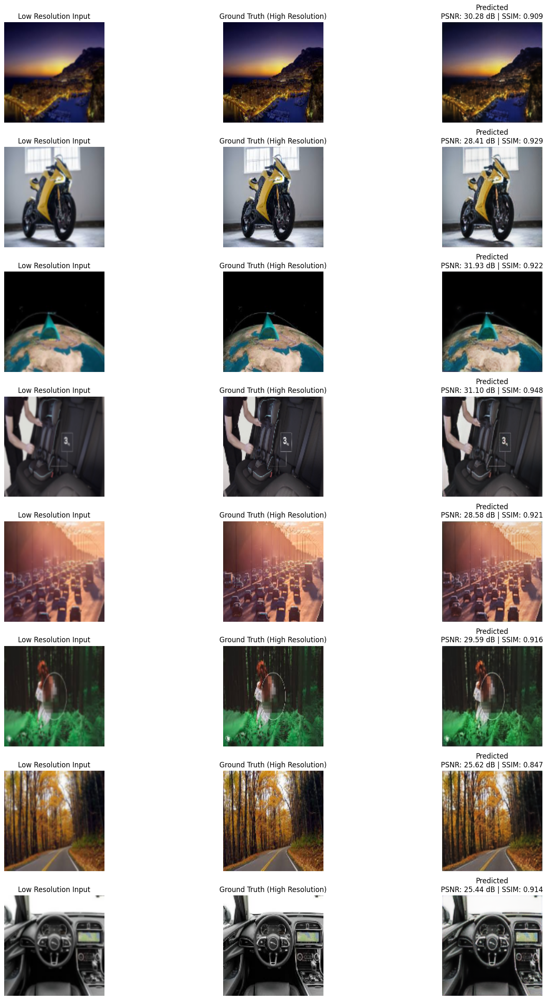

In [20]:
# ADVANCED VISUALISATION with PSNR and SSIM
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# PSNR Calculation
def calculate_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0).numpy()

# SSIM Calculation
def calculate_ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0).numpy()

# Advanced Visualization
def advanced_visualize_results(low_res, high_res, predicted, num_samples=8):
    plt.figure(figsize=(18, num_samples * 3))

    for i in range(num_samples):
        # Low Resolution Input
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(low_res[i])
        plt.title("Low Resolution Input")
        plt.axis('off')

        # High Resolution Ground Truth
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(high_res[i])
        plt.title("Ground Truth (High Resolution)")
        plt.axis('off')

        # Predicted Super-Resolution + Metrics
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(predicted[i])

        # Calculate PSNR and SSIM for this sample
        psnr_score = calculate_psnr(high_res[i], predicted[i])
        ssim_score = calculate_ssim(high_res[i], predicted[i])

        plt.title(f"Predicted\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# -------------------------------------------------

# Predict and visualize
predicted_images = model_resnet50_unet.predict(x_test, verbose=1)

# Clip predictions to [0, 1]
predicted_images = np.clip(predicted_images, 0., 1.)

# Call the advanced visualization
advanced_visualize_results(x_test, y_test, predicted_images, num_samples=8)


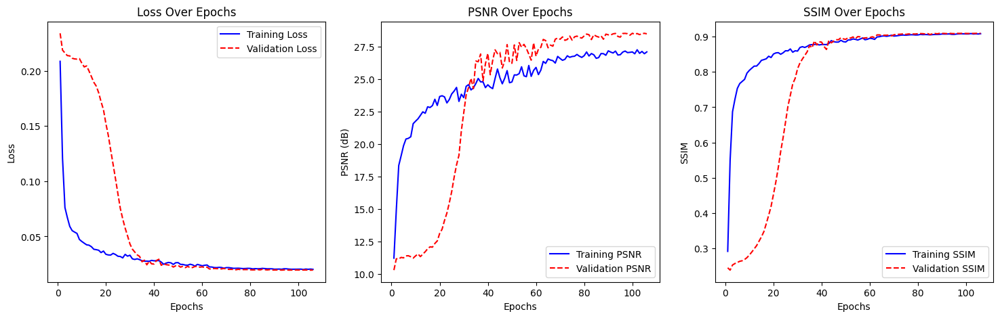

In [21]:
import matplotlib.pyplot as plt

# Assuming you extracted these from history.history
epochs = range(1, len(history.history['loss']) + 1)

plt.figure(figsize=(18,5))

# Loss
plt.subplot(1,3,1)
plt.plot(epochs, history.history['loss'], 'b-', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'r--', label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# PSNR
plt.subplot(1,3,2)
plt.plot(epochs, history.history['psnr'], 'b-', label='Training PSNR')
plt.plot(epochs, history.history['val_psnr'], 'r--', label='Validation PSNR')
plt.title('PSNR Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.legend()

# SSIM
plt.subplot(1,3,3)
plt.plot(epochs, history.history['ssim'], 'b-', label='Training SSIM')
plt.plot(epochs, history.history['val_ssim'], 'r--', label='Validation SSIM')
plt.title('SSIM Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()

plt.show()

In [ ]:
# Download it
#from google.colab import files
#files.download('resnet50_unet_model.keras')

In [ ]:
#Load it later:
from tensorflow.keras.models import load_model

# Load model
model_3 = load_model('resnet50_unet_model.keras', compile=False)

# **SRGAN**

In [14]:
import os
import glob
import hashlib
import tensorflow as tf
import cv2
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, applications
from tensorflow.keras.losses import BinaryCrossentropy, MeanSquaredError
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim


Epoch 1/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 6s 335ms/step
G Loss: 4.7175 | D Loss: 0.1251 | PSNR: 22.48 dB | SSIM: 0.6085

Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step
G Loss: 4.3385 | D Loss: 0.0400 | PSNR: 23.30 dB | SSIM: 0.6543

Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step
G Loss: 4.2178 | D Loss: 0.0181 | PSNR: 23.97 dB | SSIM: 0.6753

Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step
G Loss: 4.1047 | D Loss: 0.0093 | PSNR: 23.82 dB | SSIM: 0.6730
Reducing learning rate to 0.000100

Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step
G Loss: 3.9461 | D Loss: 0.0070 | PSNR: 24.58 dB | SSIM: 0.6912

Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step
G Loss: 3.8656 | D Loss: 0.0058 | PSNR: 24.75 dB | SSIM: 0.6933

Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step
G Loss: 3.8114 | D Loss: 0.0049 | PSNR: 24.90 dB | SSIM: 0.6985

Epoch 8/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step
G Loss: 3.7934 | D Loss: 0.0042 | PSNR: 24.97 dB | SSIM: 0.7013

Epoch 9/200
13/13 ━━

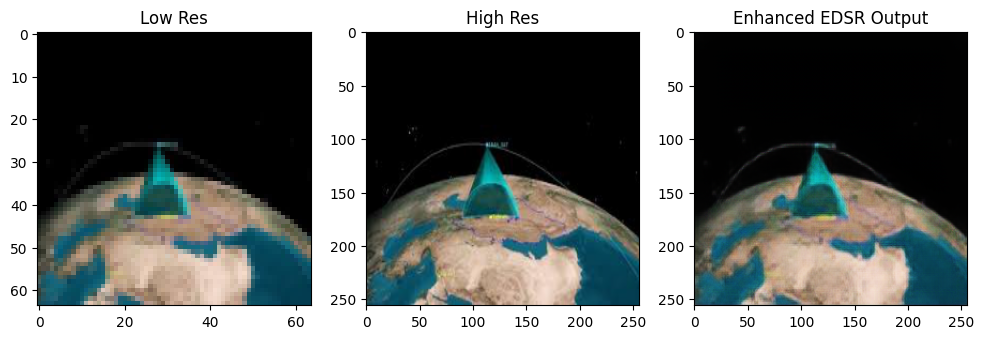

In [3]:
# Enhanced EDSR-SRGAN with RRDB, Relativistic Loss, Multi-Layer Perceptual Loss, and Augmentation

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, applications
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

lr_size = (64, 64)
hr_size = (256, 256)

# Load dataset
path = "/kaggle/input/image-super-resolution/dataset/Raw Data"
lr_path = os.path.join(path, "low_res")
hr_path = os.path.join(path, "high_res")

def load_data(path, size):
    data = []
    for img in sorted(os.listdir(path)):
        img = tf.keras.preprocessing.image.load_img(os.path.join(path, img), target_size=size)
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = (img / 127.5) - 1
        data.append(img)
    return np.array(data)

images_lr = load_data(lr_path, lr_size)
images_hr = load_data(hr_path, hr_size)

x_train_full, x_test, y_train_full, y_test = train_test_split(images_lr, images_hr, test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size=0.15, random_state=42)

# RRDB Block (from ESRGAN)
def rrdb_block(x, filters, scaling=0.2):
    def dense_block(x_input):
        inputs = [x_input]
        for _ in range(5):
            x = layers.Conv2D(filters, 3, padding='same')(x_input)
            x = layers.LeakyReLU(0.2)(x)
            inputs.append(x)
            x_input = layers.Concatenate()(inputs)
        x = layers.Conv2D(filters, 3, padding='same')(x)
        return x

    x_dense = dense_block(x)
    x_dense = layers.Lambda(lambda t: t * scaling)(x_dense)
    return layers.Add()([x, x_dense])

def upsample(x, scale, num_filters):
    def upsample_1(x, f):
        x = layers.Conv2D(f * 4, 3, padding='same')(x)
        x = layers.Lambda(lambda t: tf.nn.depth_to_space(t, 2))(x)
        return x
    if scale == 4:
        x = upsample_1(x, num_filters)
        x = upsample_1(x, num_filters)
    elif scale == 2:
        x = upsample_1(x, num_filters)
    return x

# Generator with RRDB

def build_rrdb_generator(scale=4, num_filters=64, num_rrdb_blocks=16, input_shape=(64, 64, 3)):
    x_in = layers.Input(shape=input_shape)
    x = layers.Conv2D(num_filters, 3, padding='same')(x_in)
    x_head = x
    for _ in range(num_rrdb_blocks):
        x = rrdb_block(x, num_filters)
    x = layers.Conv2D(num_filters, 3, padding='same')(x)
    x = layers.Add()([x, x_head])
    x = upsample(x, scale, num_filters)
    x_out = layers.Conv2D(3, 3, padding='same', activation='tanh')(x)
    return models.Model(inputs=x_in, outputs=x_out)

# PatchGAN Discriminator

def build_discriminator(input_shape=(256, 256, 3)):
    inp = layers.Input(shape=input_shape)
    x = inp
    for filters in [64, 128, 256, 512]:
        x = layers.Conv2D(filters, 3, strides=2, padding='same')(x)
        x = layers.LeakyReLU(0.2)(x)
        x = layers.BatchNormalization()(x)
    x = layers.Conv2D(1, 3, padding='same')(x)
    return models.Model(inputs=inp, outputs=x)

# Perceptual loss using multi-layer VGG19
vgg = applications.VGG19(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
vgg.trainable = False
layer_names = ['block1_conv2', 'block2_conv2', 'block3_conv4', 'block4_conv4']
outputs = [vgg.get_layer(name).output for name in layer_names]
vgg_model = models.Model(inputs=vgg.input, outputs=outputs)

def perceptual_loss(hr, sr):
    hr_vgg = vgg_model((hr + 1) * 127.5)
    sr_vgg = vgg_model((sr + 1) * 127.5)
    loss = 0
    for h, s in zip(hr_vgg, sr_vgg):
        loss += tf.reduce_mean(tf.abs(h - s))
    return loss

bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
l1_loss = tf.keras.losses.MeanAbsoluteError()
gen_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Relativistic loss

def relativistic_loss(real_output, fake_output):
    real_loss = bce_loss(tf.ones_like(real_output), real_output - tf.reduce_mean(fake_output))
    fake_loss = bce_loss(tf.zeros_like(fake_output), fake_output - tf.reduce_mean(real_output))
    return (real_loss + fake_loss) / 2

@tf.function
def train_step(lr_imgs, hr_imgs):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        fake_hr = generator(lr_imgs, training=True)
        real_output = discriminator(hr_imgs, training=True)
        fake_output = discriminator(fake_hr, training=True)

        adv_loss = relativistic_loss(real_output, fake_output)
        content_loss = l1_loss(hr_imgs, fake_hr)
        perc_loss = perceptual_loss(hr_imgs, fake_hr)
        total_gen_loss = content_loss + 1e-3 * adv_loss + 1e-2 * perc_loss

        disc_loss = relativistic_loss(real_output, fake_output)

    grads_gen = gen_tape.gradient(total_gen_loss, generator.trainable_variables)
    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    gen_opt.apply_gradients(zip(grads_gen, generator.trainable_variables))
    disc_opt.apply_gradients(zip(grads_disc, discriminator.trainable_variables))

    return total_gen_loss, disc_loss

from tensorflow.image import psnr, ssim

def evaluate(generator, x_val, y_val):
    val_sr = generator.predict(x_val, batch_size=8)
    val_sr = tf.clip_by_value(val_sr, -1, 1)
    psnr_val = psnr(y_val, val_sr, max_val=2.0).numpy().mean()
    ssim_val = ssim(y_val, val_sr, max_val=2.0).numpy().mean()
    return psnr_val, ssim_val

def train_srgan(x_train, y_train, epochs=200, batch_size=8):
    prev_psnr = 0
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        for i in range(0, len(x_train), batch_size):
            lr_batch = x_train[i:i+batch_size]
            hr_batch = y_train[i:i+batch_size]
            g_loss, d_loss = train_step(lr_batch, hr_batch)

        psnr_val, ssim_val = evaluate(generator, x_val, y_val)
        print(f"G Loss: {g_loss.numpy():.4f} | D Loss: {d_loss.numpy():.4f} | PSNR: {psnr_val:.2f} dB | SSIM: {ssim_val:.4f}")
        
        # Manual learning rate scheduling
        if epoch > 0 and psnr_val <= prev_psnr:
            new_lr = gen_opt.learning_rate.numpy() * 0.5
            gen_opt.learning_rate.assign(new_lr)
            disc_opt.learning_rate.assign(new_lr)
            print(f"Reducing learning rate to {new_lr:.6f}")
        prev_psnr = psnr_val

# Instantiate and train
generator = build_rrdb_generator()
discriminator = build_discriminator()
train_srgan(x_train, y_train, epochs=200, batch_size=8)

# Visualization
idx = 2
sr_img = generator.predict(x_test[idx:idx+1])[0]
lr_img = (x_test[idx] + 1) / 2
hr_img = (y_test[idx] + 1) / 2
sr_img = (sr_img + 1) / 2

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1); plt.imshow(lr_img); plt.title("Low Res")
plt.subplot(1, 3, 2); plt.imshow(hr_img); plt.title("High Res")
plt.subplot(1, 3, 3); plt.imshow(sr_img); plt.title("Enhanced EDSR Output")
plt.show()


In [6]:
def evaluate_test(generator, x_test, y_test):
    sr_test = generator.predict(x_test, batch_size=8)
    sr_test = tf.clip_by_value(sr_test, -1, 1)
    psnr_score = psnr(y_test, sr_test, max_val=2.0).numpy().mean()
    ssim_score = ssim(y_test, sr_test, max_val=2.0).numpy().mean()
    return print(f"\nFinal Evaluation on Test Set:\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.4f}")
    
# Call this after training:
evaluate_test(generator, x_test, y_test)

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step

Final Evaluation on Test Set:
PSNR: 25.82 dB | SSIM: 0.7305


22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step


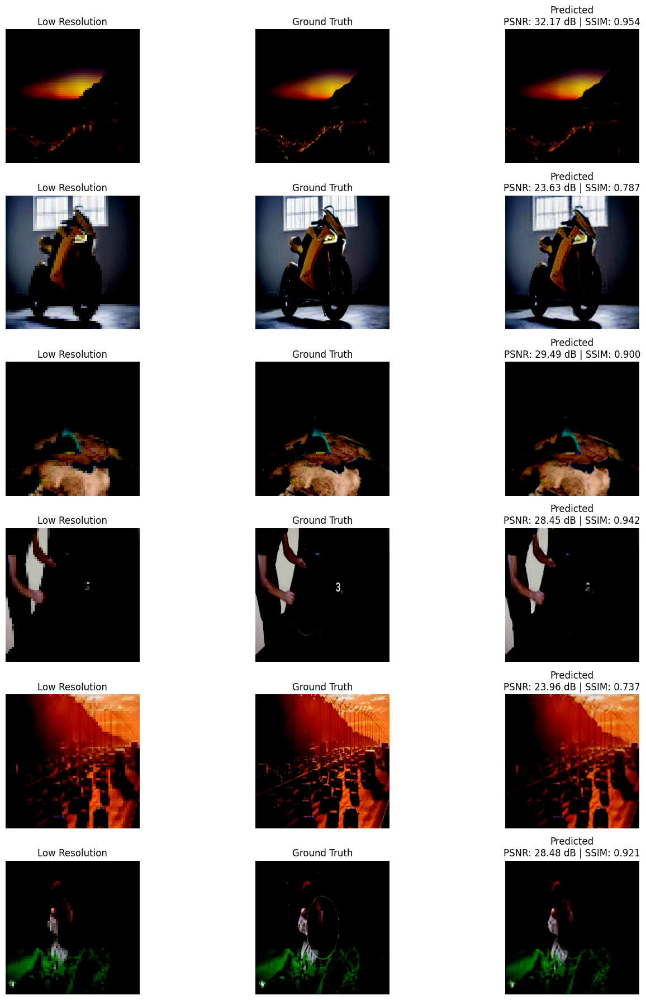

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def calculate_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0).numpy()

def calculate_ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0).numpy()

def advanced_visualize_results(low_res, high_res, predicted, num_samples=5):
    plt.figure(figsize=(15, num_samples * 3))

    for i in range(num_samples):
        lr_img = np.clip(low_res[i], 0., 1.)
        hr_img = np.clip(high_res[i], 0., 1.)
        sr_img = np.clip(predicted[i], 0., 1.)

        # Low Resolution Input
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(lr_img)
        plt.title("Low Resolution")
        plt.axis('off')

        # Ground Truth High Resolution
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(hr_img)
        plt.title("Ground Truth")
        plt.axis('off')

        # Predicted Super-Resolved
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(sr_img)
        psnr_score = calculate_psnr(hr_img, sr_img)
        ssim_score = calculate_ssim(hr_img, sr_img)
        plt.title(f"Predicted\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Predict
sr_preds = generator.predict(x_test, batch_size=8, verbose=1)
sr_preds = np.clip(sr_preds, 0., 1.)  # normalize output to [0, 1]

# Visualize
advanced_visualize_results(x_test, y_test, sr_preds, num_samples=6)


In [12]:
# SAVE THE MODEL(GRENERATOR)
generator.save("edsr_generator.keras")

In [13]:
from tensorflow.keras.models import load_model

# If saved
# model_4 = load_model("edsr_generator.keras", compile=False)

  ****with early stopping**** 


Epoch 1/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 10s 583ms/step
G Loss: 0.1070 | D Loss: 0.1439 | PSNR: 23.47 dB | SSIM: 0.6703

Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 207ms/step
G Loss: 0.0952 | D Loss: 0.0331 | PSNR: 24.48 dB | SSIM: 0.7120

Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step
G Loss: 0.0909 | D Loss: 0.0159 | PSNR: 24.85 dB | SSIM: 0.7237

Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step
G Loss: 0.0879 | D Loss: 0.0118 | PSNR: 25.02 dB | SSIM: 0.7318

Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step
G Loss: 0.0849 | D Loss: 0.0069 | PSNR: 25.30 dB | SSIM: 0.7338

Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step
G Loss: 0.0845 | D Loss: 0.0046 | PSNR: 25.14 dB | SSIM: 0.7279

Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step
G Loss: 0.0823 | D Loss: 0.0031 | PSNR: 25.68 dB | SSIM: 0.7431

Epoch 8/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step
G Loss: 0.0828 | D Loss: 0.0026 | PSNR: 25.58 dB | SSIM: 0.7452

Epoch 9/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step
G

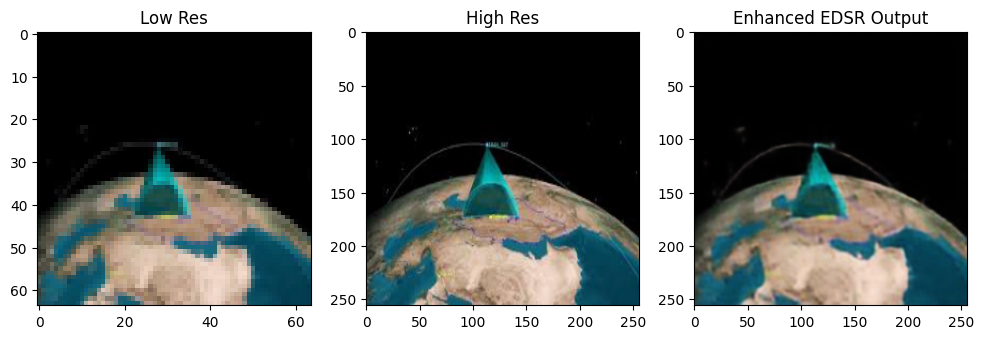

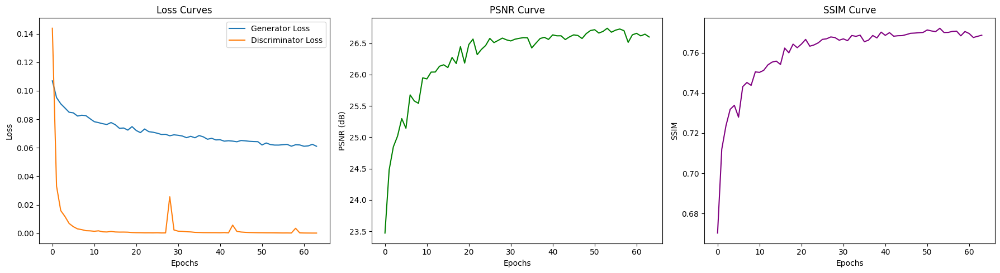

In [2]:
# Enhanced EDSR-SRGAN with RRDB, Charbonnier Loss, Deep VGG Perceptual Loss, and Cosine Decay

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, applications
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# ----------------------------- CONFIG ----------------------------- #
lr_size = (64, 64)
hr_size = (256, 256)

# Dataset Paths
path = "/kaggle/input/image-super-resolution/dataset/Raw Data"
lr_path = os.path.join(path, "low_res")
hr_path = os.path.join(path, "high_res")

# ----------------------------- DATA LOADING ----------------------------- #
def load_data(path, size):
    data = []
    for img in sorted(os.listdir(path)):
        img = tf.keras.preprocessing.image.load_img(os.path.join(path, img), target_size=size)
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = (img / 127.5) - 1
        data.append(img)
    return np.array(data)

images_lr = load_data(lr_path, lr_size)
images_hr = load_data(hr_path, hr_size)

x_train_full, x_test, y_train_full, y_test = train_test_split(images_lr, images_hr, test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size=0.15, random_state=42)

# ----------------------------- MODEL COMPONENTS ----------------------------- #

# RRDB Block
def rrdb_block(x, filters, scaling=0.2):
    def dense_block(x_input):
        inputs = [x_input]
        for _ in range(5):
            x = layers.Conv2D(filters, 3, padding='same')(x_input)
            x = layers.LeakyReLU(0.2)(x)
            inputs.append(x)
            x_input = layers.Concatenate()(inputs)
        x = layers.Conv2D(filters, 3, padding='same')(x)
        return x
    x_dense = dense_block(x)
    x_dense = layers.Lambda(lambda t: t * scaling)(x_dense)
    return layers.Add()([x, x_dense])

def upsample(x, scale, num_filters):
    def upsample_1(x, f):
        x = layers.Conv2D(f * 4, 3, padding='same')(x)
        x = layers.Lambda(lambda t: tf.nn.depth_to_space(t, 2))(x)
        return x
    if scale == 4:
        x = upsample_1(x, num_filters)
        x = upsample_1(x, num_filters)
    elif scale == 2:
        x = upsample_1(x, num_filters)
    return x

def build_rrdb_generator(scale=4, num_filters=64, num_rrdb_blocks=23, input_shape=(64, 64, 3)):
    x_in = layers.Input(shape=input_shape)
    x = layers.Conv2D(num_filters, 3, padding='same')(x_in)
    x_head = x
    for _ in range(num_rrdb_blocks):
        x = rrdb_block(x, num_filters)
    x = layers.Conv2D(num_filters, 3, padding='same')(x)
    x = layers.Add()([x, x_head])
    x = upsample(x, scale, num_filters)
    x_out = layers.Conv2D(3, 3, padding='same', activation='tanh')(x)
    return models.Model(inputs=x_in, outputs=x_out)

def build_discriminator(input_shape=(256, 256, 3)):
    inp = layers.Input(shape=input_shape)
    x = inp
    for filters in [64, 128, 256, 512]:
        x = layers.Conv2D(filters, 3, strides=2, padding='same')(x)
        x = layers.LeakyReLU(0.2)(x)
        x = layers.BatchNormalization()(x)
    x = layers.Conv2D(1, 3, padding='same')(x)
    return models.Model(inputs=inp, outputs=x)

# ----------------------------- LOSSES ----------------------------- #
vgg = applications.VGG19(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
vgg.trainable = False
vgg_model = models.Model(inputs=vgg.input, outputs=[vgg.get_layer('block5_conv4').output])

def perceptual_loss(hr, sr):
    hr_vgg = vgg_model((hr + 1) * 127.5)
    sr_vgg = vgg_model((sr + 1) * 127.5)
    return tf.reduce_mean(tf.abs(hr_vgg - sr_vgg))

def charbonnier_loss(y_true, y_pred, epsilon=1e-3):
    return tf.reduce_mean(tf.sqrt(tf.square(y_pred - y_true) + epsilon ** 2))

bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def relativistic_loss(real_output, fake_output):
    real_loss = bce_loss(tf.ones_like(real_output), real_output - tf.reduce_mean(fake_output))
    fake_loss = bce_loss(tf.zeros_like(fake_output), fake_output - tf.reduce_mean(real_output))
    return (real_loss + fake_loss) / 2

# ----------------------------- OPTIMIZERS ----------------------------- #
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=2e-4,
    decay_steps=200 * (len(x_train) // 8),
    alpha=0.01
)
gen_opt = tf.keras.optimizers.Adam(lr_schedule, beta_1=0.9)
disc_opt = tf.keras.optimizers.Adam(lr_schedule, beta_1=0.9)

# ----------------------------- TRAINING STEP ----------------------------- #
@tf.function
def train_step(lr_imgs, hr_imgs):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        fake_hr = generator(lr_imgs, training=True)
        real_output = discriminator(hr_imgs, training=True)
        fake_output = discriminator(fake_hr, training=True)

        adv_loss = relativistic_loss(real_output, fake_output)
        content_loss = charbonnier_loss(hr_imgs, fake_hr)
        perc_loss = perceptual_loss(hr_imgs, fake_hr)
        total_gen_loss = content_loss + 1e-3 * adv_loss + 1e-2 * perc_loss
        disc_loss = relativistic_loss(real_output, fake_output)

    grads_gen = gen_tape.gradient(total_gen_loss, generator.trainable_variables)
    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    gen_opt.apply_gradients(zip(grads_gen, generator.trainable_variables))
    disc_opt.apply_gradients(zip(grads_disc, discriminator.trainable_variables))

    return total_gen_loss, disc_loss

# ----------------------------- EVALUATION ----------------------------- #
from tensorflow.image import psnr, ssim

def evaluate(generator, x_val, y_val):
    val_sr = generator.predict(x_val, batch_size=8)
    val_sr = tf.clip_by_value(val_sr, -1, 1)
    psnr_val = psnr(y_val, val_sr, max_val=2.0).numpy().mean()
    ssim_val = ssim(y_val, val_sr, max_val=2.0).numpy().mean()
    return psnr_val, ssim_val

# ----------------------------- TRAINING LOOP ----------------------------- #
g_loss_hist, d_loss_hist, psnr_hist, ssim_hist = [], [], [], []

def train_srgan(x_train, y_train, epochs=200, batch_size=8):
    best_psnr = 0
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        for i in range(0, len(x_train), batch_size):
            lr_batch = x_train[i:i+batch_size]
            hr_batch = y_train[i:i+batch_size]
            g_loss, d_loss = train_step(lr_batch, hr_batch)

        # Evaluate
        psnr_val, ssim_val = evaluate(generator, x_val, y_val)

        print(f"G Loss: {g_loss.numpy():.4f} | D Loss: {d_loss.numpy():.4f} | PSNR: {psnr_val:.2f} dB | SSIM: {ssim_val:.4f}")
        g_loss_hist.append(g_loss.numpy())
        d_loss_hist.append(d_loss.numpy())
        psnr_hist.append(psnr_val)
        ssim_hist.append(ssim_val)

        # Early stopping
        logs = {'val_psnr': psnr_val}
        early_stopping.on_epoch_end(epoch, logs)
        if early_stopping.stopped_epoch > 0:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

# ----------------------------- TRAIN ----------------------------- #
generator = build_rrdb_generator()
discriminator = build_discriminator()

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_psnr', patience=10, mode='max', restore_best_weights=True)
early_stopping.set_model(generator)

train_srgan(x_train, y_train, epochs=200, batch_size=8)

# ----------------------------- VISUALIZATION ----------------------------- #
idx = 2
sr_img = generator.predict(x_test[idx:idx+1])[0]
lr_img = (x_test[idx] + 1) / 2
hr_img = (y_test[idx] + 1) / 2
sr_img = (sr_img + 1) / 2

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1); plt.imshow(lr_img); plt.title("Low Res")
plt.subplot(1, 3, 2); plt.imshow(hr_img); plt.title("High Res")
plt.subplot(1, 3, 3); plt.imshow(sr_img); plt.title("Enhanced EDSR Output")
plt.show()

import matplotlib.pyplot as plt

def plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist):
    epochs_range = range(len(g_loss_hist))

    plt.figure(figsize=(18, 5))

    # Generator & Discriminator Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs_range, g_loss_hist, label='Generator Loss')
    plt.plot(epochs_range, d_loss_hist, label='Discriminator Loss')
    plt.title('Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # PSNR over Epochs
    plt.subplot(1, 3, 2)
    plt.plot(epochs_range, psnr_hist, color='green')
    plt.title('PSNR Curve')
    plt.xlabel('Epochs')
    plt.ylabel('PSNR (dB)')

    # SSIM over Epochs
    plt.subplot(1, 3, 3)
    plt.plot(epochs_range, ssim_hist, color='purple')
    plt.title('SSIM Curve')
    plt.xlabel('Epochs')
    plt.ylabel('SSIM')

    plt.tight_layout()
    plt.show()

plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist)

In [3]:
def evaluate_test(generator, x_test, y_test):
    sr_test = generator.predict(x_test, batch_size=8)
    sr_test = tf.clip_by_value(sr_test, -1, 1)
    psnr_score = psnr(y_test, sr_test, max_val=2.0).numpy().mean()
    ssim_score = ssim(y_test, sr_test, max_val=2.0).numpy().mean()
    return print(f"\nFinal Evaluation on Test Set:\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.4f}")
    
# Call this after training:
evaluate_test(generator, x_test, y_test)

22/22 ━━━━━━━━━━━━━━━━━━━━ 7s 352ms/step

Final Evaluation on Test Set:
PSNR: 26.43 dB | SSIM: 0.7634


22/22 ━━━━━━━━━━━━━━━━━━━━ 5s 215ms/step


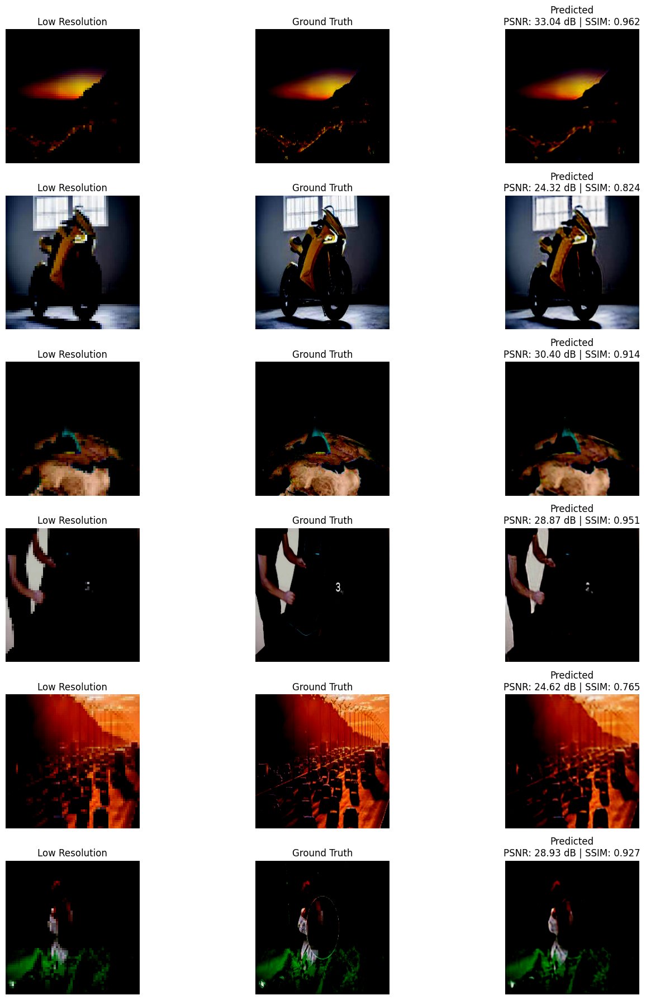

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def calculate_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0).numpy()

def calculate_ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0).numpy()

def advanced_visualize_results(low_res, high_res, predicted, num_samples=5):
    plt.figure(figsize=(15, num_samples * 3))

    for i in range(num_samples):
        lr_img = np.clip(low_res[i], 0., 1.)
        hr_img = np.clip(high_res[i], 0., 1.)
        sr_img = np.clip(predicted[i], 0., 1.)

        # Low Resolution Input
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(lr_img)
        plt.title("Low Resolution")
        plt.axis('off')

        # Ground Truth High Resolution
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(hr_img)
        plt.title("Ground Truth")
        plt.axis('off')

        # Predicted Super-Resolved
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(sr_img)
        psnr_score = calculate_psnr(hr_img, sr_img)
        ssim_score = calculate_ssim(hr_img, sr_img)
        plt.title(f"Predicted\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Predict
sr_preds = generator.predict(x_test, batch_size=8, verbose=1)
sr_preds = np.clip(sr_preds, 0., 1.)  # normalize output to [0, 1]

# Visualize
advanced_visualize_results(x_test, y_test, sr_preds, num_samples=6)


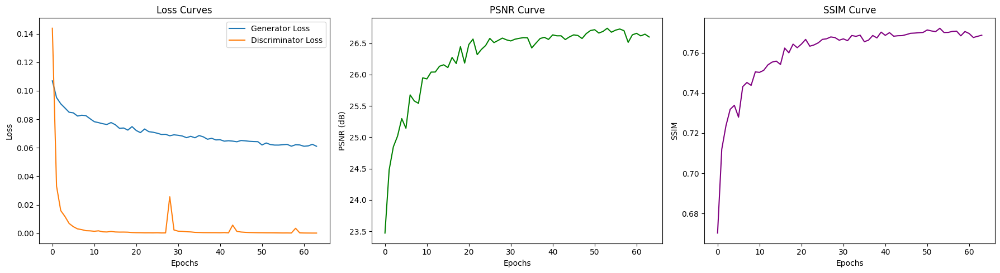

In [5]:
import matplotlib.pyplot as plt

def plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist):
    epochs_range = range(len(g_loss_hist))

    plt.figure(figsize=(18, 5))

    # Generator & Discriminator Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs_range, g_loss_hist, label='Generator Loss')
    plt.plot(epochs_range, d_loss_hist, label='Discriminator Loss')
    plt.title('Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # PSNR over Epochs
    plt.subplot(1, 3, 2)
    plt.plot(epochs_range, psnr_hist, color='green')
    plt.title('PSNR Curve')
    plt.xlabel('Epochs')
    plt.ylabel('PSNR (dB)')

    # SSIM over Epochs
    plt.subplot(1, 3, 3)
    plt.plot(epochs_range, ssim_hist, color='purple')
    plt.title('SSIM Curve')
    plt.xlabel('Epochs')
    plt.ylabel('SSIM')

    plt.tight_layout()
    plt.show()

plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist)

In [6]:
# SAVE THE MODEL(GRENERATOR)
generator.save("edsr_srgan_generator.keras")

In [ ]:
#Load it later:
from tensorflow.keras.models import load_model

# Load model
model_4 = load_model('edsr_srgan_generator.keras', compile=False)

I0000 00:00:1746619096.500310      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746619096.501000      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Epoch 1/200


I0000 00:00:1746619155.402493      96 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1746619264.918401      96 service.cc:148] XLA service 0x7ba094af5490 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746619264.919161      96 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746619264.919243      96 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


 2/13 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step

I0000 00:00:1746619268.615214      96 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


13/13 ━━━━━━━━━━━━━━━━━━━━ 15s 644ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step
G Loss: 0.1085 | D Loss: 0.1685 | PSNR: 23.37 dB | SSIM: 0.6720

Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 203ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 15s 203ms/step
G Loss: 0.0928 | D Loss: 0.0429 | PSNR: 24.52 dB | SSIM: 0.7186

Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 15s 206ms/step
G Loss: 0.0918 | D Loss: 0.0264 | PSNR: 24.56 dB | SSIM: 0.7229

Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 15s 206ms/step
G Loss: 0.0871 | D Loss: 0.0129 | PSNR: 25.26 dB | SSIM: 0.7313

Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 15s 206ms/step
G Loss: 0.0860 | D Loss: 0.0102 | PSNR: 25.51 dB | SSIM: 0.7371

Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 15s 206ms/step
G Loss: 0.0850 | D Loss: 0.0073 | PSNR: 25.62 dB | SSIM: 0.7422

Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/ste

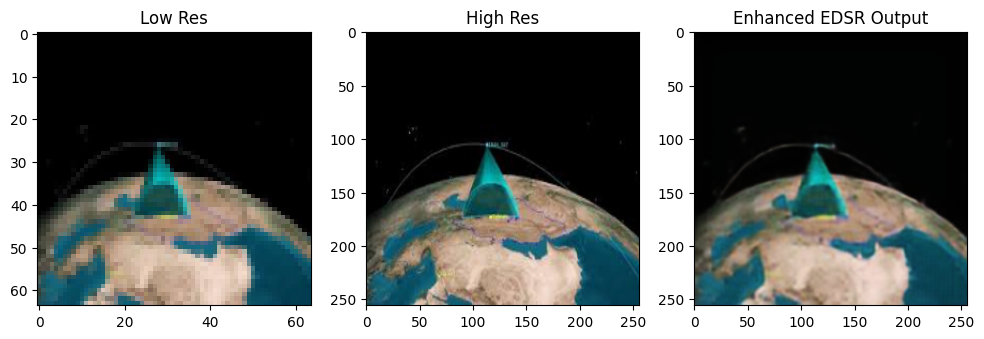

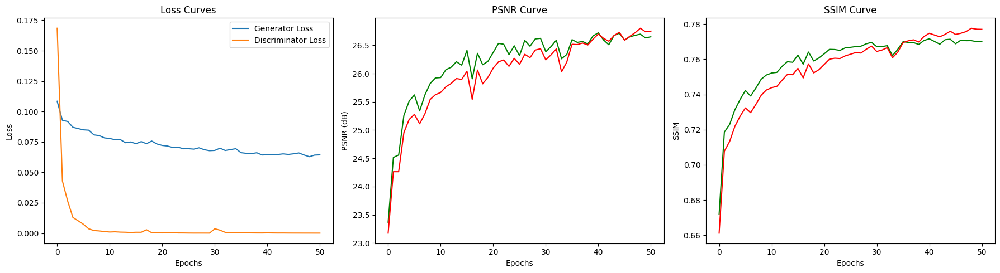

In [2]:
# Enhanced EDSR-SRGAN with RRDB, Charbonnier Loss, Deep VGG Perceptual Loss, and Cosine Decay

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, applications
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# ----------------------------- CONFIG ----------------------------- #
lr_size = (64, 64)
hr_size = (256, 256)

# Dataset Paths
path = "/kaggle/input/image-super-resolution/dataset/Raw Data"
lr_path = os.path.join(path, "low_res")
hr_path = os.path.join(path, "high_res")

# ----------------------------- DATA LOADING ----------------------------- #
def load_data(path, size):
    data = []
    for img in sorted(os.listdir(path)):
        img = tf.keras.preprocessing.image.load_img(os.path.join(path, img), target_size=size)
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = (img / 127.5) - 1
        data.append(img)
    return np.array(data)

images_lr = load_data(lr_path, lr_size)
images_hr = load_data(hr_path, hr_size)

x_train_full, x_test, y_train_full, y_test = train_test_split(images_lr, images_hr, test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size=0.15, random_state=42)

# ----------------------------- MODEL COMPONENTS ----------------------------- #

from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('float32')  # No mixed precision

# RRDB Block
def rrdb_block(x, filters, scaling=0.2):
    def dense_block(x_input):
        inputs = [x_input]
        for _ in range(5):
            x = layers.Conv2D(filters, 3, padding='same')(x_input)
            x = layers.LeakyReLU(0.2)(x)
            inputs.append(x)
            x_input = layers.Concatenate()(inputs)
        x = layers.Conv2D(filters, 3, padding='same')(x)
        return x
    x_dense = dense_block(x)
    x_dense = layers.Lambda(lambda t: t * scaling)(x_dense)
    return layers.Add()([x, x_dense])

def upsample(x, scale, num_filters):
    def upsample_1(x, f):
        x = layers.Conv2D(f * 4, 3, padding='same')(x)
        x = layers.Lambda(lambda t: tf.nn.depth_to_space(t, 2))(x)
        return x
    if scale == 4:
        x = upsample_1(x, num_filters)
        x = upsample_1(x, num_filters)
    elif scale == 2:
        x = upsample_1(x, num_filters)
    return x

def build_rrdb_generator(scale=4, num_filters=64, num_rrdb_blocks=23, input_shape=(64, 64, 3)):
    x_in = layers.Input(shape=input_shape)
    x = layers.Conv2D(num_filters, 3, padding='same')(x_in)
    x_head = x
    for _ in range(num_rrdb_blocks):
        x = rrdb_block(x, num_filters)
    x = layers.Conv2D(num_filters, 3, padding='same')(x)
    x = layers.Add()([x, x_head])
    x = upsample(x, scale, num_filters)
    x_out = layers.Conv2D(3, 3, padding='same', activation='tanh')(x)
    return models.Model(inputs=x_in, outputs=x_out)

def build_discriminator(input_shape=(256, 256, 3)):
    inp = layers.Input(shape=input_shape)
    x = inp
    for filters in [64, 128, 256, 512]:
        x = layers.Conv2D(filters, 3, strides=2, padding='same')(x)
        x = layers.LeakyReLU(0.2)(x)
        x = layers.BatchNormalization()(x)
    x = layers.Conv2D(1, 3, padding='same')(x)
    return models.Model(inputs=inp, outputs=x)

# ----------------------------- LOSSES ----------------------------- #
vgg = applications.VGG19(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
vgg.trainable = False
vgg_model = models.Model(inputs=vgg.input, outputs=[vgg.get_layer('block5_conv4').output])

def perceptual_loss(hr, sr):
    hr_vgg = vgg_model((hr + 1) * 127.5)
    sr_vgg = vgg_model((sr + 1) * 127.5)
    return tf.reduce_mean(tf.abs(hr_vgg - sr_vgg))

def charbonnier_loss(y_true, y_pred, epsilon=1e-3):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return tf.reduce_mean(tf.sqrt(tf.square(y_pred - y_true) + epsilon ** 2))

bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def relativistic_loss(real_output, fake_output):
    real_loss = bce_loss(tf.ones_like(real_output), real_output - tf.reduce_mean(fake_output))
    fake_loss = bce_loss(tf.zeros_like(fake_output), fake_output - tf.reduce_mean(real_output))
    return (real_loss + fake_loss) / 2

# ----------------------------- OPTIMIZERS ----------------------------- #
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=2e-4,
    decay_steps=200 * (len(x_train) // 8),
    alpha=0.01
)
gen_opt = tf.keras.optimizers.Adam(lr_schedule, beta_1=0.9)
disc_opt = tf.keras.optimizers.Adam(lr_schedule, beta_1=0.9)

# ----------------------------- TRAINING STEP ----------------------------- #
@tf.function
def train_step(lr_imgs, hr_imgs):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        fake_hr = generator(lr_imgs, training=True)
        real_output = discriminator(hr_imgs, training=True)
        fake_output = discriminator(fake_hr, training=True)

        adv_loss = relativistic_loss(real_output, fake_output)
        content_loss = charbonnier_loss(hr_imgs, fake_hr)
        perc_loss = perceptual_loss(hr_imgs, fake_hr)
        content_loss = tf.cast(content_loss, tf.float32)
        adv_loss = tf.cast(adv_loss, tf.float32)
        perc_loss = tf.cast(perc_loss, tf.float32)
        total_gen_loss = content_loss + 1e-3 * adv_loss + 1e-2 * perc_loss
        disc_loss = relativistic_loss(real_output, fake_output)

    grads_gen = gen_tape.gradient(total_gen_loss, generator.trainable_variables)
    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    gen_opt.apply_gradients(zip(grads_gen, generator.trainable_variables))
    disc_opt.apply_gradients(zip(grads_disc, discriminator.trainable_variables))

    return total_gen_loss, disc_loss

# ----------------------------- EVALUATION ----------------------------- #
from tensorflow.image import psnr, ssim

def evaluate(generator, x_val, y_val):
    val_sr = generator.predict(x_val, batch_size=8)
    val_sr = tf.clip_by_value(val_sr, -1, 1)
    psnr_val = psnr(y_val, val_sr, max_val=2.0).numpy().mean()
    ssim_val = ssim(y_val, val_sr, max_val=2.0).numpy().mean()
    return psnr_val, ssim_val

# ----------------------------- TRAINING LOOP ----------------------------- #
g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr = [], [], [], [], [], []

def train_srgan(x_train, y_train, epochs=200, batch_size=8):
    best_psnr = 0
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        for i in range(0, len(x_train), batch_size):
            lr_batch = x_train[i:i+batch_size]
            hr_batch = y_train[i:i+batch_size]
            g_loss, d_loss = train_step(lr_batch, hr_batch)

        # Evaluate
        psnr_val, ssim_val = evaluate(generator, x_val, y_val)
        psnr_train, ssim_train = evaluate(generator, x_train, y_train)
        
        print(f"G Loss: {g_loss.numpy():.4f} | D Loss: {d_loss.numpy():.4f} | PSNR: {psnr_val:.2f} dB | SSIM: {ssim_val:.4f}")
        g_loss_hist.append(g_loss.numpy())
        d_loss_hist.append(d_loss.numpy())
        psnr_hist.append(psnr_val)
        ssim_hist.append(ssim_val)
        psnr_tr.append(psnr_train)
        ssim_tr.append(ssim_train)
        
        # Early stopping
        logs = {'val_psnr': psnr_val}
        early_stopping.on_epoch_end(epoch, logs)
        if early_stopping.stopped_epoch > 0:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

# ----------------------------- TRAIN ----------------------------- #
generator = build_rrdb_generator()
discriminator = build_discriminator()

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_psnr', mode='max', patience=10, restore_best_weights=True)
early_stopping.set_model(generator)

train_srgan(x_train, y_train, epochs=200, batch_size=8)

# ----------------------------- VISUALIZATION ----------------------------- #
idx = 2
sr_img = generator.predict(x_test[idx:idx+1])[0]
lr_img = (x_test[idx] + 1) / 2
hr_img = (y_test[idx] + 1) / 2
sr_img = (sr_img + 1) / 2

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1); plt.imshow(lr_img); plt.title("Low Res")
plt.subplot(1, 3, 2); plt.imshow(hr_img); plt.title("High Res")
plt.subplot(1, 3, 3); plt.imshow(sr_img); plt.title("Enhanced EDSR Output")
plt.show()

import matplotlib.pyplot as plt

def plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr):
    epochs_range = range(len(g_loss_hist))

    plt.figure(figsize=(18, 5))

    # Generator & Discriminator Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs_range, g_loss_hist, label='Generator Loss')
    plt.plot(epochs_range, d_loss_hist, label='Discriminator Loss')
    plt.title('Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # PSNR over Epochs
    plt.subplot(1, 3, 2)
    plt.plot(epochs_range, psnr_hist, color='green', label='Validation PSNR')
    plt.plot(epochs_range, psnr_tr, color='red', label='Training PSNR')
    plt.title('PSNR Curve')
    plt.xlabel('Epochs')
    plt.ylabel('PSNR (dB)')

    # SSIM over Epochs
    plt.subplot(1, 3, 3)
    plt.plot(epochs_range, ssim_hist, color='green', label='Validation SSIM')
    plt.plot(epochs_range, ssim_tr, color='red', label='Training SSIM')
    plt.title('SSIM Curve')
    plt.xlabel('Epochs')
    plt.ylabel('SSIM')

    plt.tight_layout()
    plt.show()

plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr)

In [3]:
def evaluate_test(generator, x_test, y_test):
    sr_test = generator.predict(x_test, batch_size=8)
    sr_test = tf.clip_by_value(sr_test, -1, 1)
    psnr_score = psnr(y_test, sr_test, max_val=2.0).numpy().mean()
    ssim_score = ssim(y_test, sr_test, max_val=2.0).numpy().mean()
    return print(f"\nFinal Evaluation on Test Set:\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.4f}")
    
# Call this after training:
evaluate_test(generator, x_test, y_test)

22/22 ━━━━━━━━━━━━━━━━━━━━ 6s 307ms/step

Final Evaluation on Test Set:
PSNR: 26.48 dB | SSIM: 0.7647


22/22 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step


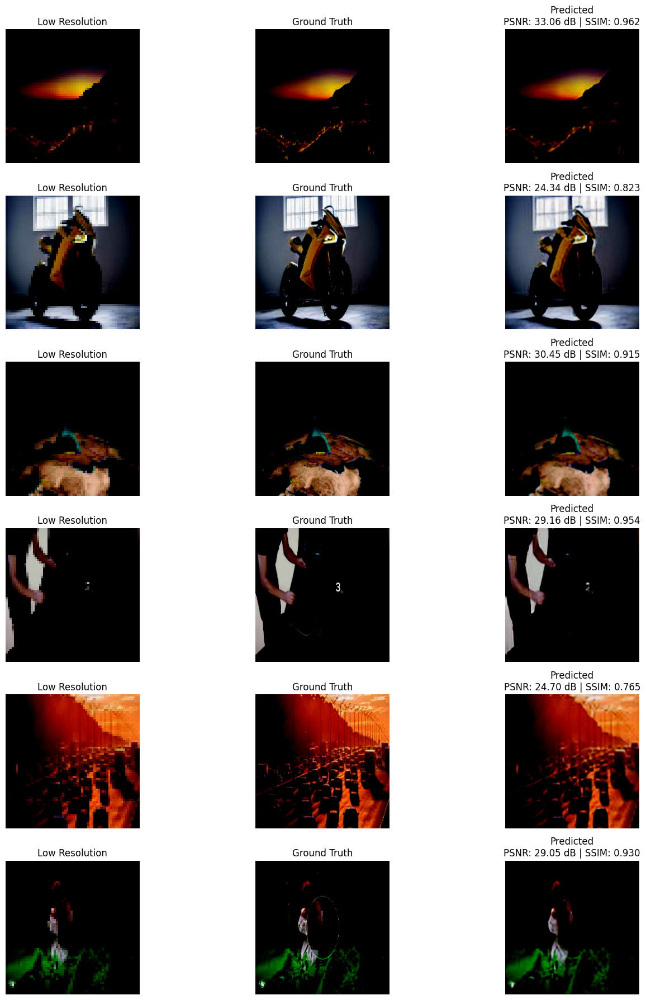

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def calculate_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0).numpy()

def calculate_ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0).numpy()

def advanced_visualize_results(low_res, high_res, predicted, num_samples=5):
    plt.figure(figsize=(15, num_samples * 3))

    for i in range(num_samples):
        lr_img = np.clip(low_res[i], 0., 1.)
        hr_img = np.clip(high_res[i], 0., 1.)
        sr_img = np.clip(predicted[i], 0., 1.)

        # Low Resolution Input
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(lr_img)
        plt.title("Low Resolution")
        plt.axis('off')

        # Ground Truth High Resolution
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(hr_img)
        plt.title("Ground Truth")
        plt.axis('off')

        # Predicted Super-Resolved
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(sr_img)
        psnr_score = calculate_psnr(hr_img, sr_img)
        ssim_score = calculate_ssim(hr_img, sr_img)
        plt.title(f"Predicted\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Predict
sr_preds = generator.predict(x_test, batch_size=8, verbose=1)
sr_preds = np.clip(sr_preds, 0., 1.)  # normalize output to [0, 1]

# Visualize
advanced_visualize_results(x_test, y_test, sr_preds, num_samples=6)


In [5]:
# SAVE THE MODEL(GRENERATOR)
generator.save("edsr_srgan_generator_final.keras")

In [ ]:
#Load it later:
from tensorflow.keras.models import load_model

# Load model
model_4 = load_model('edsr_srgan_generator_final.keras', compile=False)

# **ESRGAN** 


Epoch 1/200


I0000 00:00:1746629877.426544      93 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1746630004.548896      93 service.cc:148] XLA service 0x7c04d37a1450 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746630004.550009      93 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746630004.550034      93 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


 1/13 ━━━━━━━━━━━━━━━━━━━━ 1:24 7s/step

I0000 00:00:1746630009.055579      93 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


13/13 ━━━━━━━━━━━━━━━━━━━━ 16s 750ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 21s 297ms/step
G Loss: 0.1270 | D Loss: 0.0000 | PSNR: 22.18 dB | SSIM: 0.5858

Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step
G Loss: 0.1041 | D Loss: 0.0000 | PSNR: 23.44 dB | SSIM: 0.6711

Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step
G Loss: 0.0989 | D Loss: 0.0000 | PSNR: 24.04 dB | SSIM: 0.6972

Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step
G Loss: 0.0955 | D Loss: 0.0000 | PSNR: 24.29 dB | SSIM: 0.7046

Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step
G Loss: 0.0914 | D Loss: 0.0000 | PSNR: 24.70 dB | SSIM: 0.7130

Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step
73/73 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step
G Loss: 0.0885 | D Loss: 0.0000 | PSNR: 25.27 dB | SSIM: 0.7287

Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/ste

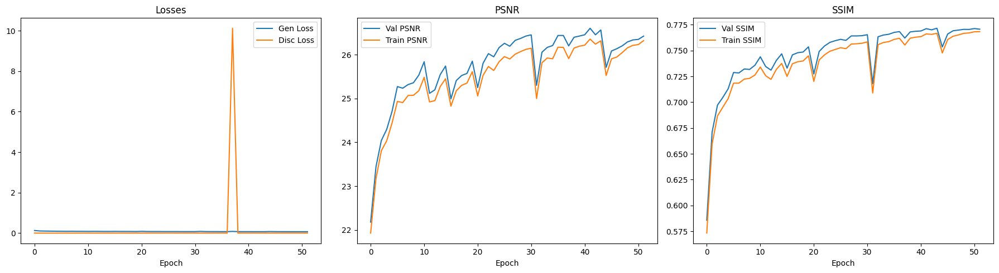

In [3]:
# ESRGAN Implementation with RRDB, Charbonnier Loss, Relativistic Loss, Deep VGG Perceptual Loss

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, applications
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# ----------------------------- CONFIG ----------------------------- #
lr_size = (64, 64)
hr_size = (256, 256)

path = "/kaggle/input/image-super-resolution/dataset/Raw Data"
lr_path = os.path.join(path, "low_res")
hr_path = os.path.join(path, "high_res")

# ----------------------------- DATA LOADING ----------------------------- #
def load_data(path, size):
    data = []
    for img in sorted(os.listdir(path)):
        img = tf.keras.preprocessing.image.load_img(os.path.join(path, img), target_size=size)
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = (img / 127.5) - 1
        data.append(img)
    return np.array(data)

images_lr = load_data(lr_path, lr_size)
images_hr = load_data(hr_path, hr_size)

x_train_full, x_test, y_train_full, y_test = train_test_split(images_lr, images_hr, test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size=0.15, random_state=42)

# ----------------------------- RRDB BLOCK ----------------------------- #
def rrdb_block(x, filters, scaling=0.2):
    def dense_block(x_input):
        inputs = [x_input]
        for _ in range(5):
            x = layers.Conv2D(filters, 3, padding='same')(x_input)
            x = layers.LeakyReLU(0.2)(x)
            inputs.append(x)
            x_input = layers.Concatenate()(inputs)
        x = layers.Conv2D(filters, 3, padding='same')(x)
        return x
    x_dense = dense_block(x)
    x_dense = layers.Lambda(lambda t: t * scaling)(x_dense)
    return layers.Add()([x, x_dense])

# ----------------------------- ESRGAN GENERATOR ----------------------------- #
def build_esrgan_generator(scale=4, num_filters=64, num_rrdb_blocks=23, input_shape=(64, 64, 3)):
    x_in = layers.Input(shape=input_shape)
    x = layers.Conv2D(num_filters, 3, padding='same')(x_in)
    x_head = x
    for _ in range(num_rrdb_blocks):
        x = rrdb_block(x, num_filters)
    x = layers.Conv2D(num_filters, 3, padding='same')(x)
    x = layers.Add()([x, x_head])

    # Upsampling (PixelShuffle)
    for _ in range(int(np.log2(scale))):
        x = layers.Conv2D(num_filters * 4, 3, padding='same')(x)
        x = layers.Lambda(lambda t: tf.nn.depth_to_space(t, 2))(x)
        x = layers.LeakyReLU(0.2)(x)

    x_out = layers.Conv2D(3, 3, padding='same', activation='tanh')(x)
    return models.Model(inputs=x_in, outputs=x_out)

# ----------------------------- DISCRIMINATOR ----------------------------- #
def build_discriminator(input_shape=(256, 256, 3)):
    x_in = layers.Input(shape=input_shape)
    x = x_in
    for filters in [64, 128, 256, 512]:
        x = layers.Conv2D(filters, 3, strides=2, padding='same')(x)
        x = layers.LeakyReLU(0.2)(x)
        x = layers.BatchNormalization()(x)
    x = layers.Flatten()(x)
    x = layers.Dense(1024)(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dense(1)(x)
    return models.Model(inputs=x_in, outputs=x)

# ----------------------------- LOSSES ----------------------------- #
vgg = applications.VGG19(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
vgg.trainable = False
vgg_model = models.Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)

def perceptual_loss(hr, sr):
    hr_vgg = vgg_model((hr + 1) * 127.5)
    sr_vgg = vgg_model((sr + 1) * 127.5)
    return tf.reduce_mean(tf.abs(hr_vgg - sr_vgg))

def charbonnier_loss(y_true, y_pred, epsilon=1e-3):
    return tf.reduce_mean(tf.sqrt(tf.square(y_pred - y_true) + epsilon**2))

def relativistic_loss(real_output, fake_output):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = bce(tf.ones_like(real_output), real_output - tf.reduce_mean(fake_output))
    fake_loss = bce(tf.zeros_like(fake_output), fake_output - tf.reduce_mean(real_output))
    return (real_loss + fake_loss) / 2

# ----------------------------- OPTIMIZERS ----------------------------- #
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(2e-4, decay_steps=200 * (len(x_train) // 8), alpha=0.01)
gen_opt = tf.keras.optimizers.Adam(lr_schedule, beta_1=0.9)
disc_opt = tf.keras.optimizers.Adam(lr_schedule, beta_1=0.9)

# ----------------------------- TRAINING ----------------------------- #
@tf.function
def train_step(lr_imgs, hr_imgs):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        sr_imgs = generator(lr_imgs, training=True)
        real_output = discriminator(hr_imgs, training=True)
        fake_output = discriminator(sr_imgs, training=True)

        adv_loss = relativistic_loss(real_output, fake_output)
        cont_loss = charbonnier_loss(hr_imgs, sr_imgs)
        perc_loss = perceptual_loss(hr_imgs, sr_imgs)
        gen_loss = cont_loss + 1e-3 * adv_loss + 1e-2 * perc_loss
        disc_loss = relativistic_loss(real_output, fake_output)

    grads_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)
    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    gen_opt.apply_gradients(zip(grads_gen, generator.trainable_variables))
    disc_opt.apply_gradients(zip(grads_disc, discriminator.trainable_variables))
    return gen_loss, disc_loss

from tensorflow.image import psnr, ssim

def evaluate(generator, x_val, y_val):
    sr_val = generator.predict(x_val, batch_size=8)
    sr_val = tf.clip_by_value(sr_val, -1, 1)
    return psnr(y_val, sr_val, max_val=2.0).numpy().mean(), ssim(y_val, sr_val, max_val=2.0).numpy().mean()

generator = build_esrgan_generator()
discriminator = build_discriminator()

# ----------------------------- EARLY STOPPING CALLBACK ----------------------------- #
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_psnr', mode='max', patience=10, restore_best_weights=True)
early_stopping.set_model(generator)

# ----------------------------- TRAINING LOOP ----------------------------- #
g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr = [], [], [], [], [], []

def train_esrgan(x_train, y_train, epochs=200, batch_size=8):
    best_psnr = 0
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        for i in range(0, len(x_train), batch_size):
            lr_batch = x_train[i:i+batch_size]
            hr_batch = y_train[i:i+batch_size]
            g_loss, d_loss = train_step(lr_batch, hr_batch)

        # Evaluate
        psnr_val, ssim_val = evaluate(generator, x_val, y_val)
        psnr_train, ssim_train = evaluate(generator, x_train, y_train)

        print(f"G Loss: {g_loss.numpy():.4f} | D Loss: {d_loss.numpy():.4f} | PSNR: {psnr_val:.2f} dB | SSIM: {ssim_val:.4f}")
        g_loss_hist.append(g_loss.numpy())
        d_loss_hist.append(d_loss.numpy())
        psnr_hist.append(psnr_val)
        ssim_hist.append(ssim_val)
        psnr_tr.append(psnr_train)
        ssim_tr.append(ssim_train)

        # Early stopping
        logs = {'val_psnr': psnr_val}
        early_stopping.on_epoch_end(epoch, logs)
        if early_stopping.stopped_epoch > 0:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break


# ----------------------------- EXECUTE ----------------------------- #
train_esrgan(x_train, y_train, epochs=200, batch_size=8)

# ----------------------------- PLOT METRICS ----------------------------- #
def plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr):
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(g_loss_hist, label='Gen Loss')
    plt.plot(d_loss_hist, label='Disc Loss')
    plt.title('Losses'); plt.xlabel('Epoch'); plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(psnr_hist, label='Val PSNR')
    plt.plot(psnr_tr, label='Train PSNR')
    plt.title('PSNR'); plt.xlabel('Epoch'); plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(ssim_hist, label='Val SSIM')
    plt.plot(ssim_tr, label='Train SSIM')
    plt.title('SSIM'); plt.xlabel('Epoch'); plt.legend()

    plt.tight_layout(); plt.show()

plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr)

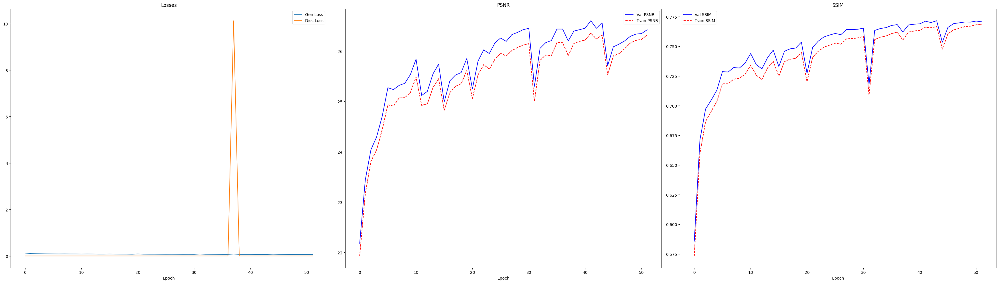

In [21]:
def plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr):
    plt.figure(figsize=(35,10))

    plt.subplot(1, 3, 1)
    plt.plot(g_loss_hist, label='Gen Loss')
    plt.plot(d_loss_hist, label='Disc Loss')
    plt.title('Losses'); plt.xlabel('Epoch'); plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(psnr_hist,'b-', label='Val PSNR')
    plt.plot(psnr_tr, 'r--', label='Train PSNR')
    plt.title('PSNR'); plt.xlabel('Epoch'); plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(ssim_hist, 'b-', label='Val SSIM')
    plt.plot(ssim_tr, 'r--', label='Train SSIM')
    plt.title('SSIM'); plt.xlabel('Epoch'); plt.legend()

    plt.tight_layout(); plt.show()

plot_training_curves(g_loss_hist, d_loss_hist, psnr_hist, ssim_hist, psnr_tr, ssim_tr)

In [4]:
def evaluate_test(generator, x_test, y_test):
    sr_test = generator.predict(x_test, batch_size=8)
    sr_test = tf.clip_by_value(sr_test, -1, 1)
    psnr_score = psnr(y_test, sr_test, max_val=2.0).numpy().mean()
    ssim_score = ssim(y_test, sr_test, max_val=2.0).numpy().mean()
    return print(f"\nFinal Evaluation on Test Set:\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.4f}")
    
# Call this after training:
evaluate_test(generator, x_test, y_test)

22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 371ms/step

Final Evaluation on Test Set:
PSNR: 26.40 dB | SSIM: 0.7661


22/22 ━━━━━━━━━━━━━━━━━━━━ 5s 230ms/step


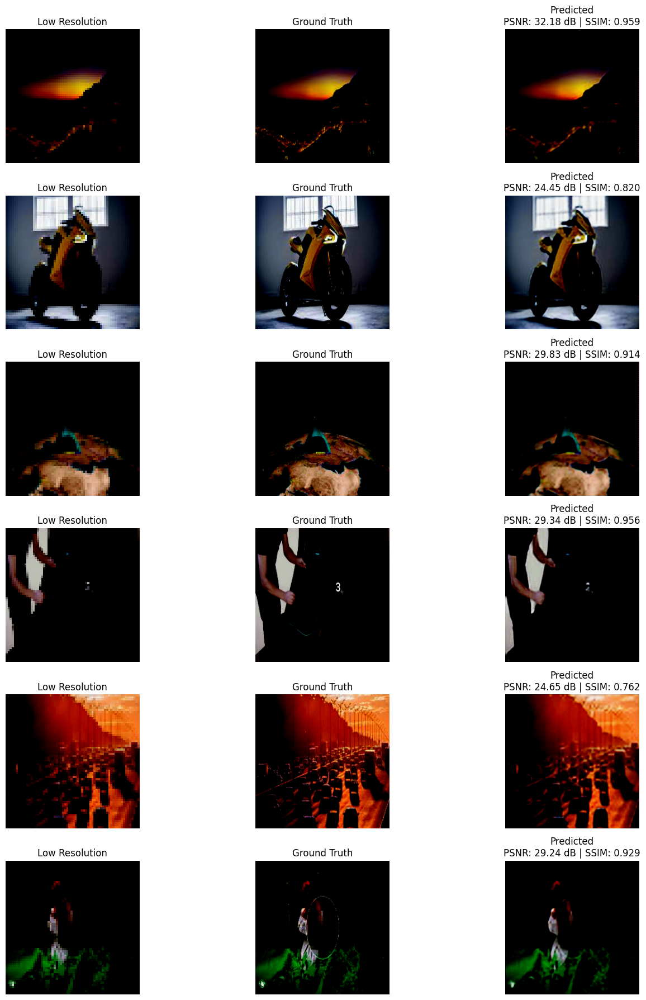

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def calculate_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0).numpy()

def calculate_ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0).numpy()

def advanced_visualize_results(low_res, high_res, predicted, num_samples=5):
    plt.figure(figsize=(15, num_samples * 3))

    for i in range(num_samples):
        lr_img = np.clip(low_res[i], 0., 1.)
        hr_img = np.clip(high_res[i], 0., 1.)
        sr_img = np.clip(predicted[i], 0., 1.)

        # Low Resolution Input
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(lr_img)
        plt.title("Low Resolution")
        plt.axis('off')

        # Ground Truth High Resolution
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(hr_img)
        plt.title("Ground Truth")
        plt.axis('off')

        # Predicted Super-Resolved
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(sr_img)
        psnr_score = calculate_psnr(hr_img, sr_img)
        ssim_score = calculate_ssim(hr_img, sr_img)
        plt.title(f"Predicted\nPSNR: {psnr_score:.2f} dB | SSIM: {ssim_score:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Predict
sr_preds = generator.predict(x_test, batch_size=8, verbose=1)
sr_preds = np.clip(sr_preds, 0., 1.)  # normalize output to [0, 1]

# Visualize
advanced_visualize_results(x_test, y_test, sr_preds, num_samples=6)


In [6]:
# SAVE THE MODEL(GRENERATOR)
generator.save("esrgan_generator.keras")

In [26]:
#Load it later:
#from tensorflow.keras.models import load_model

# Load model
#model_5 = load_model('esrgan_generator.keras', compile=False)

# **COMPARISON GRAPH**

In [24]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.image import psnr, ssim

# Paths to saved models
model_paths = {
    "U-Net": "/kaggle/working/unet_model.keras",
    "VGG16+U-Net": "C:\Users\ASUS\Downloads\best_model_vgg16_unet.keras",
    "ResNet+U-Net": "C:\Users\ASUS\Downloads\resnet50_unet_model.keras",
    "EDSR-SRGAN": "C:\Users\ASUS\Downloads\edsr_srgan_generator_final.keras",
    "ESRGAN": "C:\Users\ASUS\Downloads\esrgan_generator.keras"
}

# Load common test dataset (should be same size used by all models)
# Adjust paths and sizes accordingly
test_lr_path = "/kaggle/input/image-super-resolution/dataset/Raw Data/low_res"
test_hr_path = "/kaggle/input/image-super-resolution/dataset/Raw Data/high_res"
lr_size = (64, 64)
hr_size = (256, 256)

def load_data(path, size):
    data = []
    for img in sorted(os.listdir(path)):
        img = tf.keras.preprocessing.image.load_img(os.path.join(path, img), target_size=size)
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = (img / 127.5) - 1
        data.append(img)
    return np.array(data)

x_test = load_data(test_lr_path, lr_size)
y_test = load_data(test_hr_path, hr_size)

# Resize x_test for models that output only 64x64 (like basic U-Net)
x_test_upscaled = tf.image.resize(x_test, hr_size, method='bicubic')

# Evaluate models
psnr_scores = {}
ssim_scores = {}

for model_name, model_path in model_paths.items():
    print(f"Evaluating {model_name}...")

    # Load model
    model = tf.keras.models.load_model(model_path, compile=False)

    # Predict
    if 'U-Net' in model_name:
        sr_images = model.predict(x_test_upscaled, batch_size=8)
    else:
        sr_images = model.predict(x_test, batch_size=8)

    # Clip range for metric calculation
    sr_images = tf.clip_by_value(sr_images, -1, 1)

    # Compute PSNR and SSIM
    psnr_val = psnr(y_test, sr_images, max_val=2.0).numpy().mean()
    ssim_val = ssim(y_test, sr_images, max_val=2.0).numpy().mean()

    psnr_scores[model_name] = psnr_val
    ssim_scores[model_name] = ssim_val

    print(f"{model_name} -> PSNR: {psnr_val:.2f} dB, SSIM: {ssim_val:.4f}")

# Plot comparison
def plot_metric_comparison(metric_dict, title, ylabel):
    plt.figure(figsize=(10, 5))
    names = list(metric_dict.keys())
    values = list(metric_dict.values())
    plt.bar(names, values, color='skyblue')
    plt.ylabel(ylabel)
    plt.title(title)
    plt.xticks(rotation=20)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

plot_metric_comparison(psnr_scores, "Model Comparison - PSNR", "PSNR (dB)")
plot_metric_comparison(ssim_scores, "Model Comparison - SSIM", "SSIM")


SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 2-3: truncated \UXXXXXXXX escape (3135799537.py, line 10)